# 데이터 로드

In [1]:
import pandas as pd

df_info = pd.read_csv(r"C:\CDri_Programming\Project\Data\total_info.csv", encoding="utf-8")
df_exp = pd.read_csv(r"C:\CDri_Programming\Project\Data\total_text(matching).csv", encoding="utf-8")

print(df_info.shape)
print(df_exp.shape)

(31710, 13)
(30760, 4)


In [2]:
print(df_info.columns)
print(df_exp.columns)

Index(['num_reward', 'min_price', 'target', 'cnt_main_images',
       'cnt_title_images', 'start_date', 'end_date', 'category', 'code',
       'result', 'success', 'cnt_sell', 'subcategory'],
      dtype='object')
Index(['code', 'title', 'explain', 'main'], dtype='object')


합쳐주기

In [3]:
df_concat = pd.merge(df_info, df_exp, on="code", how="left")
df_concat = df_concat.dropna(axis='rows')
df_concat.drop_duplicates(inplace=True, subset=["code"])
print(df_concat.shape)
df_concat.to_csv(r"C:\CDri_Programming\Project\Data\test.csv", encoding="utf-8")

(30070, 16)


In [4]:
print(df_concat.columns)

df_concat.loc[:, "texts"] = df_concat.loc[:,"title"]+df_concat.loc[:,"explain"]
df_concat["texts"]

Index(['num_reward', 'min_price', 'target', 'cnt_main_images',
       'cnt_title_images', 'start_date', 'end_date', 'category', 'code',
       'result', 'success', 'cnt_sell', 'subcategory', 'title', 'explain',
       'main'],
      dtype='object')


0         월 1500원대  괴물용량 가성비 갑  5000IU 초고함량 비타민D월 1 500...
2         5 0점 한정수량  특대과로 알차게 만나는 새콤 달콤 국내산 생 백향과봄에만나는 ...
3         어버이날 전 배송  시들지 않는 효심 시들지 않는 꽃블럭시들지 않는 효심 시들지 ...
4        여성들을 위한 디자인이 독특하고 발이 편한 소가죽 골프화최근 골프인구가 크게 늘고 ...
5        발이 편한 기능성 수제골프화   골프화는 역시 넥스트큐 최근 골프인구가 크게 늘고 ...
                               ...                        
33085     명품 어글리슈즈 명품소재인데 이가격  천연송아지가죽으로 만든 데일리슈즈해외 명품 ...
33086    내게 어울리는 커피  알고 싶으시죠  스페셜티 커피 많이 들어보았고 관심은 있었지만...
33087    스킨케어의 시작은 클렌징부터오랜 연구와 개발 끝에 신제품 성분천재 클렌징오일 출시를...
33088    딱딱한 블랙헤드를 부드럽게 녹여주는  멜팅 부스터 모공 깊은 곳 단단하게 박혀있는 ...
33089    세상에 없던 특별함  꿈을 디자인하는 데일리 가방 캔버스드림백클래식하고 미니멀한 디...
Name: texts, Length: 30070, dtype: object

# Bert 단어 유사도 비교

In [2]:
import torch
from sklearn.metrics.pairwise import cosine_similarity,cosine_distances, euclidean_distances
from transformers import BertTokenizerFast, BertModel
from transformers import BertTokenizerFast, AlbertModel
from transformers import AutoModel, AutoTokenizer, AutoModelWithLMHead
from transformers import PreTrainedTokenizerFast, BartModel
from transformers import ElectraTokenizerFast, ElectraModel, ElectraTokenizer
from transformers import T5Tokenizer, T5ForConditionalGeneration, T5EncoderModel
# from numba import jit

# ------------------------- KoBert ---------------------------
# tokenizer = BertTokenizerFast.from_pretrained("kykim/bert-kor-base")
# model = BertModel.from_pretrained("kykim/bert-kor-base").to("cuda")
# tokenizer = AutoTokenizer.from_pretrained('skt/kobert-base-v1', sp_model_kwargs={'nbest_size': -1, 'alpha': 0.6, 'enable_sampling': True})
# model = AutoModel.from_pretrained('skt/kobert-base-v1').to("cuda")
# tokenizer = AutoTokenizer.from_pretrained("beomi/kcbert-large")
# model = AutoModelWithLMHead.from_pretrained("beomi/kcbert-large").to("cuda")
# tokenizer = AutoTokenizer.from_pretrained('monologg/kobert')
# model = AutoModel.from_pretrained('monologg/distilkobert').to("cuda")
# model = AutoModel.from_pretrained("lassl/bert-ko-base").to("cuda")
# tokenizer = AutoTokenizer.from_pretrained("lassl/bert-ko-base")
# ------------------------- Albert 베이스 -------------------------
# tokenizer = BertTokenizerFast.from_pretrained("kykim/albert-kor-base")
# model = AlbertModel.from_pretrained("kykim/albert-kor-base").to("cuda")
# ------------------------- BigBird --------------------------------
# model = AutoModel.from_pretrained("monologg/kobigbird-bert-base", attention_type="original_full")
# tokenizer = AutoTokenizer.from_pretrained("monologg/kobigbird-bert-base")
# ------------------ Bart 베이스 -------------------------
# tokenizer = PreTrainedTokenizerFast.from_pretrained('gogamza/kobart-base-v2')
# model = BartModel.from_pretrained('gogamza/kobart-base-v2').to("cuda")
# tokenizer = PreTrainedTokenizerFast.from_pretrained('hyunwoongko/kobart')
# model = BartModel.from_pretrained('hyunwoongko/kobart').to("cuda")
# ------------------ Sentence similarity ------------------------
# tokenizer = AutoTokenizer.from_pretrained('snunlp/KR-SBERT-V40K-klueNLI-augSTS')
# model = AutoModel.from_pretrained('snunlp/KR-SBERT-V40K-klueNLI-augSTS')
# tokenizer = AutoTokenizer.from_pretrained('jhgan/ko-sroberta-multitask')
# model = AutoModel.from_pretrained('jhgan/ko-sroberta-multitask')
# _________________ Electra ______________________
# tokenizer_electra = ElectraTokenizerFast.from_pretrained("kykim/electra-kor-base")
# model = ElectraModel.from_pretrained("kykim/electra-kor-base").to("cuda")
# model = ElectraModel.from_pretrained("monologg/koelectra-base-v3-discriminator").to("cuda")
# tokenizer = ElectraTokenizer.from_pretrained("monologg/koelectra-base-v3-discriminator")
# _________________ 혹시 모를 T5___________________
model = T5EncoderModel.from_pretrained("google/mt5-large").to("cuda")
tokenizer = T5Tokenizer.from_pretrained("google/mt5-large")
# tokenizer = T5Tokenizer.from_pretrained('KETI-AIR/ke-t5-base')
# model = T5ForConditionalGeneration.from_pretrained('KETI-AIR/ke-t5-base').to("cuda")
# model = T5EncoderModel.from_pretrained('KETI-AIR/ke-t5-base').to("cuda")

You are using a model of type mt5 to instantiate a model of type t5. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at google/mt5-large were not used when initializing T5EncoderModel: ['decoder.block.18.layer.2.layer_norm.weight', 'decoder.block.19.layer.1.EncDecAttention.q.weight', 'decoder.block.20.layer.1.EncDecAttention.q.weight', 'decoder.block.15.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.3.layer.1.layer_norm.weight', 'decoder.block.3.layer.1.EncDecAttention.o.weight', 'decoder.block.22.layer.2.DenseReluDense.wo.weight', 'decoder.block.13.layer.0.SelfAttention.k.weight', 'decoder.block.3.layer.0.SelfAttention.o.weight', 'decoder.block.18.layer.0.SelfAttention.v.weight', 'decoder.block.11.layer.0.SelfAttention.k.weight', 'decoder.block.10.layer.1.EncDecAttention.v.weight', 'decoder.block.21.layer.0.SelfAttention.q.weight', 'decoder.block.7.layer.0.layer_norm.

In [3]:
# def compare(str1, str2, is_print=True):
#     global tokenizer_bert
#     global model
    
#     inputs1 = tokenizer.batch_encode_plus([str1])
#     out1 = model(input_ids = torch.tensor(inputs1['input_ids']),
#                 attention_mask = torch.tensor(inputs1['attention_mask']))
    
#     inputs2 = tokenizer.batch_encode_plus([str2])
#     out2 = model(input_ids = torch.tensor(inputs2['input_ids']),
#                 attention_mask = torch.tensor(inputs2['attention_mask']))
    
#     cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
#     result1=cos(out1[1].reshape(1,-1).to("cuda"), out2[1].reshape(1,-1).to("cuda"))
#     # result2=euclidean_distances(out1[1].detach().numpy().reshape(1,-1), out2[1].detach().numpy().reshape(1,-1))
#     if is_print:
#         print("{} - {} : {}".format(str1, str2, *result1))
#     return result1

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

def compare(str1, str2, is_print=True):
    global tokenizer
    global model
    
    inputs1 = tokenizer.batch_encode_plus([str1])
    with torch.no_grad():
        out1 = model(input_ids = torch.tensor(inputs1['input_ids']).to("cuda"),
                    attention_mask = torch.tensor(inputs1['attention_mask']).to("cuda"),
                    # decoder_input_ids = torch.tensor(inputs1['input_ids']).to("cuda")
                    # decoder_input_ids = None
                    )
    sentence_embeddings1 = mean_pooling(out1, torch.tensor(inputs1['attention_mask']).to("cuda"))
    
    inputs2 = tokenizer.batch_encode_plus([str2])
    with torch.no_grad():
        out2 = model(input_ids = torch.tensor(inputs2['input_ids']).to("cuda"),
                    attention_mask = torch.tensor(inputs2['attention_mask']).to("cuda"),
                    # decoder_input_ids = torch.tensor(inputs2['input_ids']).to("cuda")
                    # decoder_input_ids = None
                    )
    sentence_embeddings2 = mean_pooling(out2, torch.tensor(inputs2['attention_mask']).to("cuda"))
    
    cos = torch.nn.CosineSimilarity(dim=1, eps=1e-6)
    # result1=cos(out1[1].reshape(1,-1).to("cuda"), out2[1].reshape(1,-1).to("cuda"))
    result=cos(sentence_embeddings1, sentence_embeddings2)
    # result2=euclidean_distances(out1[1].detach().numpy().reshape(1,-1), out2[1].detach().numpy().reshape(1,-1))
    if is_print:
        print("{} - {} : {}".format(str1, str2, *result))
    return result

0. 유사도는 참고용이지 무조건적인 신뢰는 금해야한다

In [4]:
compare("서울", "끾꼒깟") 
"끼", "-ㄲ"
compare("서울", "쀍뽉삙")

서울 - 끾꼒깟 : -0.009756704792380333
서울 - 쀍뽉삙 : -0.029802881181240082


tensor([-0.0298], device='cuda:0')

1. 도시

In [5]:
compare("서울", "부산")
compare("서울", "강릉")
print()
compare("서울", "도쿄")
compare("서울", "오사카")
print()
compare("서울", "파리")
compare("서울", "런던",)
compare("서울", "마드리드",)
print()
compare("서울", "워싱턴")
compare("서울", "뉴욕")

서울 - 부산 : 0.6357277631759644
서울 - 강릉 : 0.4350523054599762

서울 - 도쿄 : 0.32981574535369873
서울 - 오사카 : 0.43225786089897156

서울 - 파리 : 0.4462796151638031
서울 - 런던 : 0.3184395730495453
서울 - 마드리드 : 0.4503609240055084

서울 - 워싱턴 : 0.26406562328338623
서울 - 뉴욕 : 0.43262746930122375


tensor([0.4326], device='cuda:0')

2. 운송수단

In [6]:
compare("버스", "기차")
compare("버스", "택시")
compare("버스", "자동차")
compare("택시", "자동차")
compare("자동차", "지하철")
compare("버스", "지하철")
print()
compare("비행기", "제트기")
compare("비행기", "전투기")
compare("비행기", "지하철")
print()
compare("기차", "지하철")
compare("기차", "철도")
print("\n번외")
compare("탱크", "제트기")
compare("폭탄", "제트기")
compare("전투기", "제트기")
compare("전투기", "헬리콥터")
compare("비행기", "헬리콥터")
# "난다"라는 특성보단 운송수단이냐 전투용이냐 차이가 더 두드러지나봐

버스 - 기차 : 0.40368184447288513
버스 - 택시 : 0.6514754891395569
버스 - 자동차 : 0.19518882036209106
택시 - 자동차 : 0.06735298037528992
자동차 - 지하철 : 0.19358345866203308
버스 - 지하철 : 0.4990723431110382

비행기 - 제트기 : 0.8050356507301331
비행기 - 전투기 : 0.6627601385116577
비행기 - 지하철 : 0.4505070447921753

기차 - 지하철 : 0.40772122144699097
기차 - 철도 : 0.8584005832672119

번외
탱크 - 제트기 : 0.613099992275238
폭탄 - 제트기 : 0.7461566925048828
전투기 - 제트기 : 0.6789371967315674
전투기 - 헬리콥터 : 0.48266416788101196
비행기 - 헬리콥터 : 0.4503280520439148


tensor([0.4503], device='cuda:0')

3. 음식

In [7]:
compare("햄버거", "피자")
compare("햄버거", "콜라")
print()
compare("밥", "햄버거")
compare("밥", "김치")
compare("밥", "김")
compare("밥", "소시지")
print()
compare("달걀", "닭")
compare("치킨", "닭")
compare("치킨", "백숙")
print()
compare("김치", "김")
compare("미역", "김")
compare("다시마", "김")
compare("다시마", "미역")

햄버거 - 피자 : 0.43852803111076355
햄버거 - 콜라 : 0.12922346591949463

밥 - 햄버거 : 0.4159577786922455
밥 - 김치 : 0.5413205623626709
밥 - 김 : 0.2563595473766327
밥 - 소시지 : 0.4411701261997223

달걀 - 닭 : 0.7632272243499756
치킨 - 닭 : 0.5372501611709595
치킨 - 백숙 : 0.36614322662353516

김치 - 김 : 0.34819862246513367
미역 - 김 : 0.7588840126991272
다시마 - 김 : 0.5872588157653809
다시마 - 미역 : 0.6612380743026733


tensor([0.6612], device='cuda:0')

3. 음식2

In [8]:
compare("양식", "밥")
compare("양식", "누룽지")
compare("양식", "햄버거")
compare("양식", "스테이크")
compare("양식", "짬뽕")
compare("양식", "파스타")
print()
compare("한식", "밥")
compare("한식", "누룽지")
compare("한식", "햄버거")
compare("한식", "스테이크")
compare("한식", "짬뽕")
compare("한식", "파스타")
print()
compare("한식", "양식")
compare("한식", "중식")
compare("양식", "중식")

양식 - 밥 : 0.410976380109787
양식 - 누룽지 : 0.7100088596343994
양식 - 햄버거 : 0.11089025437831879
양식 - 스테이크 : 0.5628944635391235
양식 - 짬뽕 : 0.23325125873088837
양식 - 파스타 : 0.736699640750885

한식 - 밥 : 0.534602701663971
한식 - 누룽지 : 0.7879642844200134
한식 - 햄버거 : 0.35022279620170593
한식 - 스테이크 : 0.6317545771598816
한식 - 짬뽕 : 0.3234632611274719
한식 - 파스타 : 0.6973724365234375

한식 - 양식 : 0.6912140250205994
한식 - 중식 : 0.7617756128311157
양식 - 중식 : 0.8540686964988708


tensor([0.8541], device='cuda:0')

4. 동물

In [9]:
compare("개", "고양이")
compare("개", "거북이")
compare("토끼", "거북이")
compare("개", "강아지")
print()
compare("당나귀", "말")
compare("당나귀", "노새")
compare("말", "노새")

개 - 고양이 : 0.7223899960517883
개 - 거북이 : 0.6570332646369934
토끼 - 거북이 : 0.8447238802909851
개 - 강아지 : 0.6823111176490784

당나귀 - 말 : 0.4033638536930084
당나귀 - 노새 : 0.5967913866043091
말 - 노새 : 0.7172799110412598


tensor([0.7173], device='cuda:0')

5. 계층

In [10]:
compare("왕", "여왕")
compare("왕", "왕자")
compare("왕", "공주")
compare("여왕", "공주")
compare("여왕", "왕자")
print()
compare("왕", "거지")
compare("여왕", "거지")
compare("왕자", "거지")
compare("왕", "평민")
print()
compare("왕", "귀족")
compare("왕", "양반")
compare("귀족", "양반")

왕 - 여왕 : 0.5505463480949402
왕 - 왕자 : 0.746599018573761
왕 - 공주 : 0.5541853904724121
여왕 - 공주 : 0.5678803324699402
여왕 - 왕자 : 0.5762245655059814

왕 - 거지 : 0.4833011031150818
여왕 - 거지 : 0.37235429883003235
왕자 - 거지 : 0.6493039131164551
왕 - 평민 : 0.5885956287384033

왕 - 귀족 : 0.5989903807640076
왕 - 양반 : 0.5591363310813904
귀족 - 양반 : 0.7456167936325073


tensor([0.7456], device='cuda:0')

In [11]:
error

NameError: name 'error' is not defined

100. 단일

In [ ]:
str = "서울"

inputs = tokenizer.batch_encode_plus([str])
out = model(input_ids = torch.tensor(inputs['input_ids']),
            attention_mask = torch.tensor(inputs['attention_mask']))
# print(out["logits"].shape)
print(out[1].shape)

str = "마드리드"

inputs = tokenizer.batch_encode_plus([str])
out = model(input_ids = torch.tensor(inputs['input_ids']),
            attention_mask = torch.tensor(inputs['attention_mask']))
# print(out["logits"].shape)
print(out[1].shape)

str = "요것은 문장이다 그러므로 참고해라"

inputs = tokenizer.batch_encode_plus([str])
out = model(input_ids = torch.tensor(inputs['input_ids']),
            attention_mask = torch.tensor(inputs['attention_mask']))
# print(out["logits"].shape)
print(out[1].shape)

torch.Size([1, 768])
torch.Size([1, 768])
torch.Size([1, 768])


# Vector.csv 생성

In [12]:
import torch
from transformers import AutoTokenizer, AutoModel
from transformers import BertTokenizerFast, EncoderDecoderModel
from transformers import T5Tokenizer, T5ForConditionalGeneration, T5EncoderModel
# tokenizer = AutoTokenizer.from_pretrained("kykim/bert-kor-base")
# model = AutoModel.from_pretrained("kykim/bert-kor-base")

# model = AutoModel.from_pretrained("monologg/kobigbird-bert-base", attention_type="original_full")
# tokenizer = AutoTokenizer.from_pretrained("monologg/kobigbird-bert-base")
# tokenizer = AutoTokenizer.from_pretrained('snunlp/KR-SBERT-V40K-klueNLI-augSTS')
# model = AutoModel.from_pretrained('snunlp/KR-SBERT-V40K-klueNLI-augSTS')
# tokenizer = AutoTokenizer.from_pretrained('jhgan/ko-sroberta-multitask')
# model = AutoModel.from_pretrained('jhgan/ko-sroberta-multitask').to("cuda")
# tokenizer = AutoTokenizer.from_pretrained('skt/kobert-base-v1', sp_model_kwargs={'nbest_size': -1, 'alpha': 0.6, 'enable_sampling': True})
# model = AutoModel.from_pretrained('skt/kobert-base-v1').to("cuda")
# tokenizer = BertTokenizerFast.from_pretrained("kykim/bert-kor-base")
# model = AutoModel.from_pretrained("kykim/bert-kor-base").to("cuda")

# tokenizer = T5Tokenizer.from_pretrained('KETI-AIR/ke-t5-base')
# model = T5EncoderModel.from_pretrained('KETI-AIR/ke-t5-base').to("cuda")
# tokenizer = T5Tokenizer.from_pretrained('KETI-AIR/ke-t5-large')
# model = T5EncoderModel.from_pretrained('KETI-AIR/ke-t5-large').to("cuda")
model = T5EncoderModel.from_pretrained("google/mt5-large").to("cuda")
tokenizer = T5Tokenizer.from_pretrained("google/mt5-large")z

You are using a model of type mt5 to instantiate a model of type t5. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at google/mt5-large were not used when initializing T5EncoderModel: ['decoder.block.18.layer.2.layer_norm.weight', 'decoder.block.19.layer.1.EncDecAttention.q.weight', 'decoder.block.20.layer.1.EncDecAttention.q.weight', 'decoder.block.15.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.3.layer.1.layer_norm.weight', 'decoder.block.3.layer.1.EncDecAttention.o.weight', 'decoder.block.22.layer.2.DenseReluDense.wo.weight', 'decoder.block.13.layer.0.SelfAttention.k.weight', 'decoder.block.3.layer.0.SelfAttention.o.weight', 'decoder.block.18.layer.0.SelfAttention.v.weight', 'decoder.block.11.layer.0.SelfAttention.k.weight', 'decoder.block.10.layer.1.EncDecAttention.v.weight', 'decoder.block.21.layer.0.SelfAttention.q.weight', 'decoder.block.7.layer.0.layer_norm.

In [13]:
inputs2 = tokenizer.batch_encode_plus(["강아지"])
with torch.no_grad():
    out2 = model(input_ids = torch.tensor(inputs2['input_ids']).to("cuda"),
                attention_mask = torch.tensor(inputs2['attention_mask']).to("cuda"),
                # decoder_input_ids = torch.tensor(inputs2['input_ids']).to("cuda")
                # decoder_input_ids = None
                )
print(out2[0].shape)

torch.Size([1, 4, 1024])


In [14]:
import pandas as pd
from tqdm import tqdm

df_concat = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
df_concat["texts"] = df_concat["title"]+df_concat["explain"]
# df_vec = pd.DataFrame(columns=["code"]+["value{}".format(idx) for idx in range(768)])
df_vec = pd.DataFrame(columns=["code"]+["value{}".format(idx) for idx in range(1024)])

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)


loop = tqdm(df_concat["texts"])
for title, code in zip(loop, df_concat["code"]):
    inputs = tokenizer.batch_encode_plus([title])
    with torch.no_grad():
        out = model(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                    attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
    sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
    # df_vec.loc[len(df_vec)] = [code, *out[1].detach().numpy().ravel()]
    df_vec.loc[len(df_vec)] = [code, *sentence_embeddings.to("cpu").detach().numpy().ravel()]

df_vec.to_csv(r"C:\CDri_Programming\Project\Data\MT5_large.csv", index=False)

100%|██████████| 30070/30070 [23:36<00:00, 21.23it/s]


# (현재 포기) main 콜럼 (길이때문에 Big Bird만 적용 가능)

In [ ]:
import torch
import random
import pandas as pd
from transformers import AutoModel, AutoTokenizer

# 문장이 너무 기니까 빅버드 사용하기
model = AutoModel.from_pretrained("monologg/kobigbird-bert-base", attention_type="original_full").to("cuda")
tokenizer = AutoTokenizer.from_pretrained("monologg/kobigbird-bert-base")
df_concat = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")

Some weights of the model checkpoint at monologg/kobigbird-bert-base were not used when initializing BigBirdModel: ['cls.seq_relationship.weight', 'cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BigBirdModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BigBirdModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
df_vec = pd.DataFrame(columns=["code"]+["value{}".format(idx) for idx in range(768)])

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

with open("main.txt", "a") as file:
    loop = tqdm(df_concat["main"])
    for sent, code in zip(loop, df_concat["code"]):
        sent = sent[:4096]
        inputs = tokenizer.batch_encode_plus([sent])
        with torch.no_grad():
            out = model(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                        attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
        sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
        # df_vec.loc[len(df_vec)] = [code, *sentence_embeddings.detach().numpy().ravel()]
        for feat in [code, *sentence_embeddings.to("cpu").detach().numpy().ravel()]:
            file.write("{};".format(feat))
        file.write("\n")
        file.flush()

100%|██████████| 30070/30070 [51:04<00:00,  9.81it/s]  


In [ ]:
import pandas as pd

dum = pd.read_csv(r"C:\CDri_Programming\Project\Ipynb\main.txt", sep=";")
dum = dum.dropna(axis=1)
dum = dum.dropna(axis=0)
dum.columns = range(dum.columns.size)
dum = dum.drop_duplicates(subset=0)
dum = dum.reset_index()
del dum["index"]
dum = dum.rename(columns={0:"code"})
print(dum.columns)
dum.to_csv(r"C:\CDri_Programming\Project\Data\BigBird_main.csv", index=False)

Index(['code',      1,      2,      3,      4,      5,      6,      7,      8,
            9,
       ...
          759,    760,    761,    762,    763,    764,    765,    766,    767,
          768],
      dtype='object', length=769)


In [ ]:
import pandas as pd
df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
df_ori.to_csv("text.csv", encoding="utf-8", index=False)

# Keyword 추출

In [ ]:
import pandas as pd
from transformers import BertTokenizerFast, EncoderDecoderModel
from transformers import AutoModel, AutoTokenizer
from tqdm import tqdm
import torch

df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
tokenizer_pre = AutoTokenizer.from_pretrained("kykim/bertshared-kor-base")
model_pre = EncoderDecoderModel.from_pretrained("kykim/bertshared-kor-base").to("cuda")

c:\Anaconda\envs\PyTorch\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
The following encoder weights were not tied to the decoder ['bert/pooler']
The following encoder weights were not tied to the decoder ['bert/pooler']


In [ ]:
import torch

df_concat = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
df_concat["texts"] = df_concat["title"]+df_concat["explain"]
df_summ = pd.DataFrame(columns=["code", "sent"])

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)


loop = tqdm(df_concat["texts"])
for title, code in zip(loop, df_concat["code"]):
    # input_pre = tokenizer_pre.encode(title, return_tensors= 'pt')
    input_pre = tokenizer_pre(title, return_tensors= 'pt')

    sentence_length = len(input_pre[0])
    min_length = max(10, int(0.1*sentence_length))
    max_length = min(128, int(0.3*sentence_length))

    with torch.no_grad():
        outputs = model_pre.generate(
            input_pre["input_ids"].to("cuda"),
            min_length=10,
            max_length=20,
            pad_token_id=input_pre["token_type_ids"].to("cuda")
        )

    out_pre = tokenizer_pre.decode(outputs[0], skip_special_tokens=True)
    
    
    df_summ.loc[len(df_summ)] = [code, out_pre]
    
df_summ.to_csv(r"C:\CDri_Programming\Project\Data\bertshared_title.csv", index=False)

100%|██████████| 30070/30070 [2:41:14<00:00,  3.11it/s]  


문장에서 단어 추출하기

In [ ]:
import itertools
import random
import pandas as pd
import numpy as np

import stanza
from konlpy.tag import Okt, Kkma, Komoran
from copy import deepcopy as deep
from transformers import AutoTokenizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
# from sentence_transformers import SentenceTransformer

stanza.download('ko')       # This downloads the English models for the neural pipeline
# tokenizer = AutoTokenizer.from_pretrained('skt/kobert-base-v1', sp_model_kwargs={'nbest_size': -1, 'alpha': 0.6, 'enable_sampling': True})
df_summ = pd.read_csv(r"C:\CDri_Programming\Project\Data\bertshared_title.csv")
df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv")
nlp = stanza.Pipeline('ko')

2022-05-28 14:49:13 INFO: Downloading default packages for language: ko (Korean)...
2022-05-28 14:49:13 INFO: File exists: C:\Users\qkfxh\stanza_resources\ko\default.zip
2022-05-28 14:49:14 INFO: Finished downloading models and saved to C:\Users\qkfxh\stanza_resources.
2022-05-28 14:49:19 INFO: Loading these models for language: ko (Korean):
| Processor | Package |
-----------------------
| tokenize  | kaist   |
| pos       | kaist   |
| lemma     | kaist   |
| depparse  | kaist   |

2022-05-28 14:49:19 INFO: Use device: gpu
2022-05-28 14:49:19 INFO: Loading: tokenize
2022-05-28 14:49:21 INFO: Loading: pos
2022-05-28 14:49:21 INFO: Loading: lemma
2022-05-28 14:49:22 INFO: Loading: depparse
2022-05-28 14:49:22 INFO: Done loading processors!


In [ ]:
alph_sml = []
alph_lg = []
for i in range(65,91):
    alph_lg.append(chr(i))
for i in range(97,123):
    alph_sml.append(chr(i))
print(alph_sml)
print(alph_lg)

['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


In [ ]:
Jeosa = [
    '이',
    "가",
    "께서",
    "에서",
    "서",
    "의",
    "을",
    "를",
    "가",
    "에",
    "에게",
    "게",
    "께",
    "한테",
    "에게서",
    "보다",
    "로서",
    "로써",
    "라고",
    "고",
    "와",
    "와의",
    "과",
    "과의",
    "랑",
    "이랑",
    "같이",
    "처럼",
    "만큼",
    "은",
    "는",
    "이",
    "가",
    "도",
    "까지",
    "마저",
    "조차",
    "들",
    "들이",
    "들과",
    "대로"
]

this_is_not_word = [
    "1",
    "2",
    "3",
    "4",
    "5",
    "6",
    "7",
    "8",
    "9",
    "0",
    *alph_lg,
    *alph_sml,
    "와디즈",
    "것을",
    "이제",
    
]

설명 : 기존의 형태소 분석기는 단어더라도 단어 내에서의 단어를 또 찾아내서 분해해버리는 경향이 있음 <br>
이게 많이 위험한게 단어들을 헤쳐놔서 키워드 분석하는데 어려움이 따름 <br>
stanza 는 스탠포드 대학에서 유지하고 카이스트에서 제공한 가중치로 이루어진 패키지로 단어의 형태를 더 잘 유지함 <br>
하지만 stanza도 문제가 있는게, 뒤에 조사를 분해를 안 함<br>
그래서 모든 단어를 쪼개서 야랄나는 Konlpy에 있는 형태소 분석기에 stanza로 쪼갠 단어들을 제공하면 조사와 단어를 잘 분리한다는 생각에 아래 방식대로 진행 <br>
형태소 분석기로 분해된 단어에 을,를과 같은 조사들이 붙어있는지 확인하고 있으면 조사를 제거한 단어로 교체 <br>
하지만 각 형태소 분석기들마다 다른 분석을 하기 때문에 두 시행을 모두 거친후에 서로의 결과를 다시 한번 참고하여 최종결과 도출 <br> 
한계 : 그럼에도 존재하는 한계가 있는데, 여전히 조사를 다 구분하지 못함<br>
그래서 생각한게 그냥 단어 끝에 조사가 들어간다고 생각하면 무지성 삭제를 하는 것이 어떨까 생각했는데 <br>
귀걸이 같은 단어는 끝에 "이"가 들어가서 포기함 <br>

분해를 해서 조지는 경우 : 황금향->황금,향, 유무선->유,무선 <br>
분해가 적당한 경우 : 안전우산->안전, 우산, 캐시미어울(전반적인 소재 옷)->캐시미어,울, 국내독점->국내,독점 <br>
분해가 베스트인 경우 : 가정간편식-> 간편, 가정식

In [ ]:
df_ori["sent"] = df_ori["title"] +" "+ df_ori["explain"]
okt = Okt()
kkma = Kkma()
komo = Komoran()

def compare_each_other(just : set(), konlp: set()):
    new_set = deep(just)
    # 단어에 조사 붙어있는게 있으면 제거
    for word in just:
        for itSelf in just:
            for jeosa in Jeosa:
                if itSelf+jeosa in word and word in new_set:
                    # print("removed {} - reason : jeosa".format(word))
                    new_set.remove(word)
    # 중복된 단어 제거 혹은 두 단어의 합성어를 통일
    # word 가 합성어 itSelf가 더 작은 단어
    for word in just:
        for itSelf in just:
            if itSelf in word and word in new_set and itSelf != word:
                # print("removed {} - reason : duplicate".format(word))
                new_set.remove(word)
                # new_set.add(word.replace(itSelf, ""))
        # 추가 예외 처리
    for word in just:
        for not_word in this_is_not_word:
            if not_word in word and word in new_set:  
                # print("removed {} - reason : not word".format(word))
                new_set.remove(word)
                break
    # 추가 형태소 분석기랑 비교, 조사 빼고 아예 명사만 남기기
    for word in konlp:
        for jeosa in Jeosa:
            if word+jeosa in new_set:
                print("removed {} - reason : konlp".format(word+jeosa))
                new_set.remove(word+jeosa)
                new_set.add(word)
    return new_set

def compare_result(words_okt, words_kkma):
    result = words_okt.union(words_kkma)
    for word_okt in words_okt:
        for jeosa in Jeosa:
            if word_okt+jeosa in result:
                # print("removed {} - reason : result_okt".format(word_okt+jeosa))
                result.remove(word_okt+jeosa)
    for word_kkma in words_kkma:
        for jeosa in Jeosa:
            if word_kkma + jeosa in result:
                # print("removed {} - reason : result_kkma".format(word_kkma+jeosa))
                result.remove(word_kkma+jeosa)

    return result

    
# sent = df_summ["sent"][1]
def extract_noun(sent, is_print = False):
    doc = nlp(sent)
    words = set()
    words_okt = set()
    words_kkma = set()

    for sentence in doc.sentences:
        for word1 in sentence.words:
            # print(word.text, word.lemma, word.pos)
            if word1.pos == "NOUN":
                if len(word1.text) ==1:
                    continue
                words.add(word1.text)
                #방법3
                result = okt.nouns(word1.text)
                for word in result:
                    if len(word) ==1:
                        continue
                    words_okt.add(word)
                #방법4
                result = kkma.nouns(word1.text)
                for word in result:
                    if len(word) ==1:
                        continue
                    words_kkma.add(word)
    if is_print:
        print("before : {}".format(words))
    words_okt = compare_each_other(words, words_okt)
    if is_print:
        print("after okt : {}".format(words_okt))
    words_kkma = compare_each_other(words, words_kkma)
    if is_print:
        print("after kkma : {}".format(words_kkma))
    result = compare_result(words_okt, words_kkma)
    if is_print:
        print("\nafter result : {}".format(result))
    return result

# 결과끼리 단어+조사인 것을 먼저 교체하고 그리고 
# 100703
    

In [ ]:
import random

for _ in range(150):
    rand_idx = random.randint(1, len(df_ori))
    sent = df_ori.iloc[rand_idx]["title"]
    print(sent)
    # extract_noun(sent, is_print=True)
    print("okt : ", okt.nouns(sent))
    print("kkma : ", kkma.nouns(sent))
    stanza = []
    doc = nlp(sent)
    for sentence in doc.sentences:
        for word1 in sentence.words:
            if word1.pos == "NOUN":
                stanza.append(word1.text)
    print("stanza : ", stanza)
    print()

아늑하고 쾌적한 아이들의 공간  아이집  실내용 조립식 펫하우스
okt :  ['아이', '공간', '아이', '집', '실', '내용', '조립', '펫', '하우스']
kkma :  ['아이', '공간', '아이집', '집', '실', '실내용', '내용', '조립식', '펫', '펫하우스', '하우스']
stanza :  ['아이들의', '공간', '아이집', '실내용', '조립식', '펫하우스']

백화점 브랜드  이제 1 10 가격으로 맘껏 빌려 입어요  스타일윅스 
okt :  ['백화점', '브랜드', '이제', '가격', '맘껏', '스타일', '윅스']
kkma :  ['백화점', '브랜드', '이제', '1', '10', '가격', '입어', '스타일', '스타일윅', '윅']
stanza :  ['백화점', '브랜드']

환경을 지키는데 이건 할수 있잖아  환경을 살리는 단 하나의 스니커즈 
okt :  ['환경', '이건', '환경', '단', '하나', '스니커즈']
kkma :  ['환경', '수', '단', '하나', '스니커즈']
stanza :  ['환경을', '환경을', '스니커즈']

화장실에서 잘까  4만 원 투자로 환풍구 배수구 냄새 한번에 관리 끝 
okt :  ['화장실', '원', '투자', '환', '풍구', '배', '수구', '냄새', '한번', '관리', '끝']
kkma :  ['화장실', '4', '4만', '만', '원', '투자', '환풍구', '배수구', '냄새', '한번', '관리', '끝']
stanza :  ['원', '환풍구', '배수구', '냄새', '관리', '끝']

  4 5 점   3만원대로 만나는 하금안경테
okt :  ['점', '금', '안경', '테']
kkma :  ['4', '5', '점', '3', '3만원', '만', '원', '하', '하금안경테', '금', '안경테']
stanza :  ['점']

 오직와디즈  한국의 나사 항공우주연구원을 손목으로  해리엇 x KAR

In [ ]:
from tqdm import tqdm

df_keyword = pd.DataFrame(columns=["code","sent","keywords"])

loop = tqdm(range(len(df_ori)-1))
for idx in loop:
    sent = df_ori["sent"][idx]
    code = df_ori["code"][idx]
    result = extract_noun(sent)
    df_keyword.loc[idx] = [code, sent, result]

df_keyword.to_csv(r"C:\CDri_Programming\Project\Data\keywords.csv", encoding="cp949", index=False)

100%|██████████| 30069/30069 [45:28<00:00, 11.02it/s] 


In [ ]:
idx = len(df_ori)-1
sent = df_ori["sent"][idx]
code = df_ori["code"][idx]
result = extract_noun(sent)
print(code, sent, result)

17228 세상에 없던 특별함  꿈을 디자인하는 데일리 가방 캔버스드림백 클래식하고 미니멀한 디자인에 나만의 모티브로 세상에 없던 특별함을 디자인하는 데일리 가방 {'특별함을', '캔버스드림백', '나만의', '데일리', '가방', '꿈을'}


단일

In [ ]:
# code = 100703
code = 22479

sent = df_ori.loc[df_ori["code"]==code, ["sent"]]
print(sent)
extract_noun(sent.values[0][0],True)

                                                sent
29999  아키클래식 삭스 스니커즈 플라이삭스 하이 아키클래식 삭스 스니커즈 플라이삭스 하이
before : {'삭스'}
after akt : {'삭스'}
after kkma : {'삭스'}
after result : {'삭스'}


{'삭스'}

# 키워드로 벡터 계산

In [15]:
import torch
import pandas as pd
from tqdm import tqdm
from transformers import AutoModel, AutoTokenizer, AutoModelWithLMHead
from transformers import T5Tokenizer, T5ForConditionalGeneration, T5EncoderModel

df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
df_keyword = pd.read_csv(r"C:\CDri_Programming\Project\Data\keywords2.csv", encoding="cp949")
# tokenizer = AutoTokenizer.from_pretrained('skt/kobert-base-v1', sp_model_kwargs={'nbest_size': -1, 'alpha': 0.6, 'enable_sampling': True})
# model = AutoModel.from_pretrained('skt/kobert-base-v1').to("cuda")

# tokenizer = T5Tokenizer.from_pretrained('KETI-AIR/ke-t5-large')
# model = T5EncoderModel.from_pretrained('KETI-AIR/ke-t5-large').to("cuda")
model = T5EncoderModel.from_pretrained("google/mt5-large").to("cuda")
tokenizer = T5Tokenizer.from_pretrained("google/mt5-large")

You are using a model of type mt5 to instantiate a model of type t5. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at google/mt5-large were not used when initializing T5EncoderModel: ['decoder.block.18.layer.2.layer_norm.weight', 'decoder.block.19.layer.1.EncDecAttention.q.weight', 'decoder.block.20.layer.1.EncDecAttention.q.weight', 'decoder.block.15.layer.0.SelfAttention.o.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.3.layer.1.layer_norm.weight', 'decoder.block.3.layer.1.EncDecAttention.o.weight', 'decoder.block.22.layer.2.DenseReluDense.wo.weight', 'decoder.block.13.layer.0.SelfAttention.k.weight', 'decoder.block.3.layer.0.SelfAttention.o.weight', 'decoder.block.18.layer.0.SelfAttention.v.weight', 'decoder.block.11.layer.0.SelfAttention.k.weight', 'decoder.block.10.layer.1.EncDecAttention.v.weight', 'decoder.block.21.layer.0.SelfAttention.q.weight', 'decoder.block.7.layer.0.layer_norm.

In [16]:
df_keyword

,code,sent,keywords
0,145312,월 1500원대 괴물용량 가성비 갑 5000IU 초고함량 비타민D 월 1 50...,기존 괴물용량 사탕수수 가성비 친환경
1,145132,5 0점 한정수량 특대과로 알차게 만나는 새콤 달콤 국내산 생 백향과 봄에만나는...,국내산 봄에만나는 열대과일 백향과를 달콤 마지막 한정수량 온가족이 새콤
2,145082,어버이날 전 배송 시들지 않는 효심 시들지 않는 꽃블럭 시들지 않는 효심 시들지...,어버이날 사랑 효심 배송 꽃블럭 카네이션
3,145037,여성들을 위한 디자인이 독특하고 발이 편한 소가죽 골프화 최근 골프인구가 크게 늘고...,골프인구가 최근 골프화 넥스트큐 소가죽 여성들을 발이 호평 수제 디자인
4,144930,발이 편한 기능성 수제골프화 골프화는 역시 넥스트큐 최근 골프인구가 크게 늘고...,골프인구가 호평 수제 최근 골프화 넥스트큐 기능성 발이 디자인
...,...,...,...
30065,17680,명품 어글리슈즈 명품소재인데 이가격 천연송아지가죽으로 만든 데일리슈즈 해외 명품...,세리버만 해외 개성 천연송아지가죽만의 명품 특유 원가 소재 이가격 가격 소외계층 브...
30066,17358,내게 어울리는 커피 알고 싶으시죠 스페셜티 커피 많이 들어보았고 관심은 있었지...,커피 스페셜티 원두 기회 관심
30067,17349,스킨케어의 시작은 클렌징부터 오랜 연구와 개발 끝에 신제품 성분천재 클렌징오일 출시...,개발 출시 성분천재 시작 신제품
30068,17258,딱딱한 블랙헤드를 부드럽게 녹여주는 멜팅 부스터 모공 깊은 곳 단단하게 박혀있는...,모공 하루 멜팅 블랙헤드 부스터 고민


In [17]:
import re

all_words = set()
keywords = df_keyword["keywords"][0]

for keywords in df_keyword["keywords"]:
    words = keywords.split(" ")
    for word in words:
        all_words.add(word)

print(len(all_words))

44292


In [18]:
df_keyvec = pd.DataFrame(columns=["word"]+["keyvec{}".format(idx) for idx in range(1024)])

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

loop = tqdm(all_words)
for word in loop:
    inputs = tokenizer.batch_encode_plus([word])
    with torch.no_grad():
        out = model(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                    attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
    sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
    # words_out = torch.vstack(words_out).mean(0)
    df_keyvec.loc[len(df_keyvec)] = [word, *sentence_embeddings.to("cpu").detach().numpy().ravel()]

df_keyvec.to_csv(r"C:\CDri_Programming\Project\Data\keywords_vec_mt5.csv", index=False)

100%|██████████| 44292/44292 [1:42:58<00:00,  7.17it/s]


키워드 풀링

In [1]:
from transformers import T5Tokenizer, T5ForConditionalGeneration, T5EncoderModel

# tokenizer = T5Tokenizer.from_pretrained('KETI-AIR/ke-t5-large')
# model = T5EncoderModel.from_pretrained('KETI-AIR/ke-t5-large').to("cuda")

model = T5EncoderModel.from_pretrained("google/mt5-large").to("cuda")
tokenizer = T5Tokenizer.from_pretrained("google/mt5-large")

c:\Anaconda\envs\PyTorch\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
You are using a model of type mt5 to instantiate a model of type t5. This is not supported for all configurations of models and can yield errors.
Some weights of the model checkpoint at google/mt5-large were not used when initializing T5EncoderModel: ['decoder.block.18.layer.1.layer_norm.weight', 'decoder.block.0.layer.2.DenseReluDense.wi_0.weight', 'decoder.block.7.layer.2.DenseReluDense.wo.weight', 'decoder.block.14.layer.0.SelfAttention.v.weight', 'decoder.block.0.layer.1.EncDecAttention.k.weight', 'decoder.block.15.layer.0.SelfAttention.o.weight', 'decoder.block.20.layer.2.layer_norm.weight', 'decoder.block.22.layer.2.DenseReluDense.wi_1.weight', 'decoder.block.16.layer.2.DenseReluDense.wo.weight', 'decoder.block.4.layer.0.SelfAttention.k

In [2]:
import torch
import pandas as pd
from tqdm import tqdm

df_keyvec= pd.read_csv(r"C:\CDri_Programming\Project\Data\keywords_vec_mt5.csv", encoding="utf-8").replace(' ', '', regex=True)
df_keyword = pd.read_csv(r"C:\CDri_Programming\Project\Data\keywords2.csv", encoding="cp949")

In [3]:
import numpy as np

df_pooledVec = pd.DataFrame(columns=["code"]+["wordsPooled{}".format(idx) for idx in range(1024)])
for idx in tqdm(range(len(df_keyword))):
    keywords = df_keyword["keywords"][idx].split(" ")
    sent_vector = []
    for word in keywords:
        vector = df_keyvec.loc[df_keyvec["word"] == word].values[0][1:]
        sent_vector.append(vector.reshape(1,-1))
    sent_vector = np.concatenate(sent_vector, axis=0)
    sent_vector = np.mean(sent_vector, axis=0)
    df_pooledVec.loc[len(df_pooledVec)] = [df_keyword["code"][idx], *sent_vector]
    
df_pooledVec.to_csv(r"C:\CDri_Programming\Project\Data\pooled_keyVec_mt5.csv", index=False)

100%|██████████| 30070/30070 [20:05<00:00, 24.95it/s]


## 축약된 문장으로 벡터 계산

In [ ]:
import pandas as pd
from transformers import BertTokenizerFast, EncoderDecoderModel
from transformers import AutoModel, AutoTokenizer
from tqdm import tqdm
import torch

df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
df_summ = pd.read_csv(r"C:\CDri_Programming\Project\Data\bertshared_title.csv")
tokenizer = AutoTokenizer.from_pretrained('jhgan/ko-sroberta-multitask')
model = AutoModel.from_pretrained('jhgan/ko-sroberta-multitask').to("cuda")

In [ ]:
df_summ = pd.DataFrame(columns=["code"]+["summ{}".format(idx) for idx in range(768)])

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)

loop = tqdm(df_concat["texts"])
for title, code in zip(loop, df_concat["code"]):
    inputs = tokenizer.batch_encode_plus([out_pre])
    with torch.no_grad():
        out = model(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                    attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
    sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
    df_summ.loc[len(df_summ)] = [code, *sentence_embeddings.to("cpu").detach().numpy().ravel()]

df_summ.to_csv(r"C:\CDri_Programming\Project\Data\bertshared_soberta.csv", index=False)

100%|██████████| 30070/30070 [15:58<00:00, 31.36it/s]


In [23]:
import pandas as pd

dum = pd.DataFrame(columns=range(6), index=range(5))

for i in range(30):
    print(i, end=" ")
    dum.iloc[i//6, i%6] = i

dict1 = {
    1 : 30,
    2 : 31,
    3 : 32,
    4 : 33,
    5 : 34,
}
dum = dum.append(dict1, ignore_index=True)
dum

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 

C:\Users\qkfxh\AppData\Local\Temp\ipykernel_11684\2078788830.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  dum = dum.append(dict1, ignore_index=True)


,0,1,2,3,4,5
0,0,1,2,3,4,5
1,6,7,8,9,10,11
2,12,13,14,15,16,17
3,18,19,20,21,22,23
4,24,25,26,27,28,29
5,NaN,30,31,32,33,34


# 클러스터링 적용

(현재 포기) 카테고리 단어도 BERT 벡터화 -> 너무 고차원인거 같아서 포기<br>
하지만 차원수를 너무 높이지 않는 방식이 나쁘지 않을수도?

pre_process()

In [26]:
import pandas as pd
from copy import deepcopy as deep
from sklearn.preprocessing import StandardScaler 

def pre_process(added=None):
    df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
    if added:
        df_ori = df_ori.append(added, ignore_index=True)
    df_ori.dropna(axis=0, inplace=True)
    
    df_ = deep(df_ori)

    # 시기를 기간으로 바꿈
    df_["start_date"] = pd.to_datetime(df_["start_date"])
    df_["end_date"] = pd.to_datetime(df_["end_date"])
    df_["duration"] = (df_["end_date"] - df_["start_date"]).dt.days

    # 실수형 데이터 제외 다 삭제
    del df_["start_date"]
    del df_["end_date"]
    del df_["title"]
    del df_["explain"]
    del df_["main"]
    del df_["Unnamed: 0"]
    del df_["result"]
    del df_["success"]
    
    df_cat = df_["category"]
    del df_["category"]
    df_subCat = df_["subcategory"]
    del df_["subcategory"]
    df_code = df_["code"]
    del df_["code"]

    scaler = StandardScaler()
    df_.loc[:, :] = scaler.fit_transform(df_)
    print(df_.shape)

    # scaler = MinMaxScaler()
    #원핫인코딩
    df_ = pd.concat([df_ ,pd.get_dummies(df_cat, prefix="cat")], axis=1)
    df_ = pd.concat([df_ ,pd.get_dummies(df_subCat, prefix="subCat")], axis=1)
    # df = df_
    df_ = pd.concat([df_ ,df_code], axis=1)
    
    
    df_keyvec = pd.read_csv(r"C:\CDri_Programming\Project\Data\pooled_Vec.csv")
    
    # df_vec = pd.read_csv(r"C:\CDri_Programming\Project\Data\SROBERT.csv")
    df_vec = pd.read_csv(r"C:\CDri_Programming\Project\Data\SRoBert2.csv")
    
    if added:
        sent = added["title"] +" "+ added["explain"]
        words = extract_noun(sent)
        
        words_vec = []
        for word in words:
            inputs = tokenizer_word.batch_encode_plus([word])
            with torch.no_grad():
                out = model_word(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                            attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
            sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
            # words_out = torch.vstack(words_out).mean(0)
            words_vec.append(sentence_embeddings)
        words_vec = np.concatenate(words_vec, axis=0)
        words_vec = np.mean(words_vec, axis=0)
        df_keyvec.loc[len(df_keyvec)] = [added["code"], *words_vec]
        
        inputs = tokenizer_sent.batch_encode_plus([sent])
        with torch.no_grad():
            out = model_sent(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                        attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
        sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
        # words_out = torch.vstack(words_out).mean(0)
        df_vec.loc[len(df_vec)] = [added["code"], sentence_embeddings]
    

    df_ = df_.merge(df_keyvec, how="left", on="code")
    df = df_.merge(df_vec, how="left", on="code")
    del df["code"]
    print(df.shape)
    return df

## Kmeans

### cluaster 개수 체크

In [10]:
import pandas as pd

df_keyword = pd.read_csv(r"C:\CDri_Programming\Project\Data\keywords2.csv", encoding="cp949")
df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")

df_ori = df_ori.merge(df_keyword, on="code", how="left")
del df_ori["sent"]

Random state 바꿔가며 클러스터가 어떻게 변경되는지 확인하기<br>
0번째 컬럼을 기준으로 다른 컬럼들에서 어떻게 변경이 되는지 확인하기

In [11]:
# from sklearn.cluster import KMeans

# df_only_cluster = pd.DataFrame()
# df = pre_process()
# for idx in range(100):
#     kmeans = KMeans(n_clusters=17, random_state=idx).fit(df)
#     df_only_cluster.loc[:,idx] = kmeans.labels_
#     kmeans = None
# df_only_cluster.to_csv("clusters.csv", index=False)

In [12]:
# import pandas as pd 

# df_only_cluster = pd.read_csv(r"C:\CDri_Programming\Project\Ipynb\clusters.csv")

# col0_index = []

# for i in range(17):
#     for row in range(len(df_only_cluster)):
#         cluster = df_only_cluster.iloc[row,0]
#         if cluster == i:
#             col0_index.append(row)
#             break
# col0_index

In [13]:
# for num in range(1,100):
#     for cluster, row in enumerate(col0_index):
#         cluster_cmp = df_only_cluster.iloc[row, num]
#         print("cluster cmp : ", cluster_cmp)
#         print(df_only_cluster.loc[(df_only_cluster.loc[:,"0"]==cluster)&(df_only_cluster.loc[:,str(num)]==cluster_cmp), :].value_counts())
#     break

In [14]:
from sklearn.cluster import KMeans

df = pre_process()
df_cl = deep(df_ori)
kmeans = KMeans(n_clusters=25, random_state=0).fit(df)
df_cl["cluster"] = kmeans.labels_

df_cl["cluster"].value_counts()

(30070, 7)
(30070, 1599)


0     1972
12    1894
24    1765
1     1757
15    1647
13    1629
3     1609
2     1568
4     1567
6     1399
17    1259
10    1241
8     1203
19    1182
23    1152
16    1091
11    1047
14    1046
22     923
18     877
20     804
5      782
7      460
21     194
9        2
Name: cluster, dtype: int64

In [16]:
kmeans.cluster_centers_.shape

(25, 1599)

## 실루엣 계수 확인

In [32]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

df = pre_process()
coeff_by_cluster = pd.DataFrame()

for cluster in range(5,51,5):
    kmeans = KMeans(n_clusters=cluster, random_state=0).fit(df)
    coeff_by_cluster["cluster"] = kmeans.labels_
    coeffs = silhouette_samples(df.values, kmeans.labels_)
    coeff_by_cluster["coeffs"] = coeffs
    scores = silhouette_score(df.values, kmeans.labels_)
    print(scores)
    print(coeff_by_cluster.groupby('cluster')['coeffs'].mean())

(30070, 7)
(30070, 2623)
0.04165971812583469
cluster
0    0.076295
1   -0.015063
2    0.000602
3    0.114248
4    0.065971
Name: coeffs, dtype: float64


KeyboardInterrupt: 

In [ ]:
print(scores)

0.024748251778589005


In [ ]:
df = pre_process()
df.values.shape

(30070, 7)


(30070, 1599)

In [ ]:
# with open("file.txt", "w") as file:
#     df[["num_reward", "min_price"]].to_csv(r'pandas.txt', header=None, index=None, sep=' ', mode='a')

In [ ]:
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_samples, silhouette_score
# from tqdm import tqdm

# df = pre_process()
# coeff_by_cluster = pd.DataFrame()
# loop = tqdm(range(100))
# with open("pandas.txt", "a") as file:
#     for random_state in loop:
#         kmeans = KMeans(n_clusters=17, random_state=random_state).fit(df)
#         coeff_by_cluster["cluster"] = kmeans.labels_
#         coeffs = silhouette_samples(df.values, kmeans.labels_)
#         coeff_by_cluster["coeffs"] = coeffs
#         scores = silhouette_score(df.values, kmeans.labels_)
#         file.write("state - {}, scores : {}\n".format(random_state, scores))
#         coeff_by_cluster.groupby('cluster')['coeffs'].mean().to_csv(r'pandas.txt', header=None, index=None, sep=' ', mode='a')
#         file.write("\n")
#         file.flush()
#         loop.set_description("{:.4f}".format(scores))

## DBScan

In [ ]:
from sklearn.cluster import DBSCAN

df_cl = deep(df_ori)
clustering = DBSCAN(eps=8, min_samples=10).fit(df)
df_cl["cluster"] = clustering.labels_
df_cl["cluster"].value_counts()

-1     21278
 2      6862
 8       223
 15      213
 5       211
       ...  
 36        9
 62        9
 27        8
 53        8
 57        7
Name: cluster, Length: 66, dtype: int64

DB 파라미터 확인

In [ ]:
import numpy as np
from tqdm import tqdm

# print(range(0.01, 5, 0.01))
loop =  tqdm(np.arange(5, 10.1, 0.1))
with open("eps_comb2.txt", "a") as file:
    for eps in loop:
        for num_sample in [10,20,50,100,250,500,1000]:
            loop.set_description("{}".format(num_sample))
            clustering = DBSCAN(eps=eps, min_samples=num_sample).fit(df)
            df_cl["cluster"] = clustering.labels_
            cluster_num = len(df_cl["cluster"].unique())
            if cluster_num > 10:
                file.write("eps : {}, number of sample {}\n".format(eps, num_sample))
                file.flush()

20:   0%|          | 0/51 [00:39<?, ?it/s]

In [6]:
pending_dict

{'code': 138885,
 'sub_category': '기타 재화',
 'title': ' 운전자 필수  메종줄리 엉덩이가 숨쉬는 자동차 방석',
 'explain': '뜨끈뜨끈한 좌석  땀에 젖은 엉덩이    이제  메종줄리 엉숨방석으로 쾌적한 드라이브  ',
 'main': 'Q  크라우드펀딩  특히 와디즈를 선택하신 이유가 궁금합니다  와디즈에서 펀딩하시는 이유와  이번 펀딩에서 성공한다면 펀딩금으로 무엇을 하실 계획인지 들려주세요  지난 엉숨방석 1탄 프로젝트를 통해 제품에 대한 실제 사용자의 생각과 개선점을 알 수 있는 소중한 시간이였습니다  와디즈를 통해 펀딩된 금액은 제품의 개선과 개발에 사용됩니다  클라우드 쿠션이라는 좋은 소재를 활용하여 우리의 생활을 더 좋게 변화 시킬 수 있는 좋은 제품들을 개발하겠습니다   Q  취급 시 주의사항   세탁은 어떻게 하나요    두 개의 원형고정구를 분리한 후  세탁기에 넣어 40도 이하의 온수로 세탁해주세요     염소계 표백제 사용금지   건조기 사용금지   드라이클리닝 금지   다림질 금지  쿠션 특성상 자외선에 닿으면 노랗게 변색될 수 있으나 제품 사용에서 이상이 없습니다  탈수 후 그늘에 뉘어 건조해주세요     믿고 펀딩해 주신 리워드  이렇게 보내드리겠습니다  펀딩 종료 후 7월 1일부터 로젠 택배를 통해 하루 최대 50개씩 순차배송됩니다    ',
 'num_reward': 7,
 'min_price': 53800,
 'target': 1000000,
 'cnt_main_images': 10,
 'cnt_title images': 6,
 'start_date': '2022.06.06',
 'end_date': '2022.06.20',
 'category': '홈·리빙',
 'result': '150'}

# 클러스터링 결과 확인

클러스터링 결과 시각화(개소리)<br>
x-축 : 성공 금액 <br>
y-축 : 아무 벡터 <br>
색깔 : 클러스터링 라벨 <br>

이게 이론상 참 애매한게 결국 제품 자체에 대한 정보가 카테고리, 서브카테고리, 제목+설명을 제외하면
<br>
목표 금액, 이미지 개수, 리워드 개수 같이 분산이 그렇게 크지 않은 값들이 다니까
<br>
결과로 분산은 작게 되다보니까, 데이터들의 분포는 위에 3개에 크게 의존하게 되는데 
<br>
그 안에서 유의미한 결과를 나누기 위해선 결국 모델에게 무릎꿇고 제대로 분류했길 기도하는 수 밖에 없는데
<br>
<br>

클러스터 별 수 확인

([<matplotlib.patches.Wedge at 0x1e7ae7b7eb0>,
 [Text(-1.0460200458307094, 0.3403557899027439, '성공'),
  Text(1.0460200697305133, -0.34035571645114493, '실패')],
 [Text(-0.5705563886349324, 0.18564861267422395, '89.99%'),
  Text(0.570556401671189, -0.1856485726097154, '10.01%')])

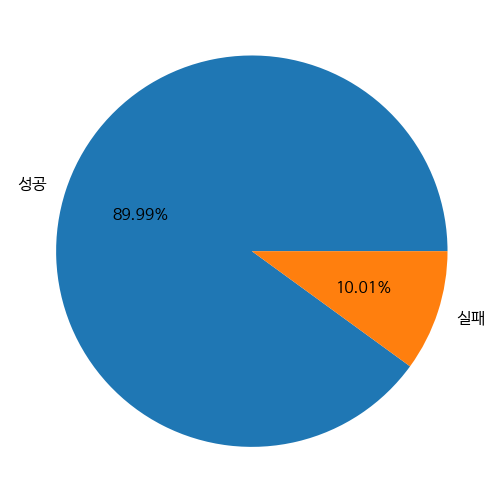

In [ ]:
import matplotlib.pyplot as plt
import matplotlib
import matplotlib.font_manager as fm
# fm.get_fontconfig_fonts()
# font_location = '/usr/share/fonts/truetype/nanum/NanumGothicOTF.ttf'
dir = "C:\\Windows\\Fonts"
# dir = "C:\\Users\\qkfxh\\AppData\\Local\\Microsoft\\Windows\\Fonts"
# font_location = dir + '\\NanumSquare_0.ttf' # For Windows
font_location = dir + '\\Hancom Gothic Bold.ttf' # For Windows
font_name = fm.FontProperties(fname=font_location).get_name()
matplotlib.rc('font', family=font_name, size=16)
plt.figure(figsize=[16,9])

data = df_ori.success.value_counts()
plt.pie(data, labels=["성공", "실패"], autopct='%1.2f%%')

In [ ]:
import tqdm

df_catNum = pd.DataFrame(columns=df_cl["cluster"].unique(), index=df_cl["category"].unique())

# loop1 = df_cl["cluster"].unique()
loop = tqdm.tqdm(df_cl["category"].unique())

for category in loop:
    for cluster in df_cl["cluster"].unique():
        # by category
        total = len(df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), :])
            # print("{}(total {}): {}".format(cluster, total, rate))
        df_catNum.loc[category, cluster] = total
        # loop.set_description("{} - {}".format(category, cluster))

df_catNum.to_csv(r"C:\CDri_Programming\Project\result\Cluster_num.csv", encoding="cp949")

100%|██████████| 17/17 [00:00<00:00, 26.24it/s]


In [ ]:
# import tqdm

# # K 결과
# # clusters = [7,1,13,0,26]
# # category = "클래스·컨설팅"
# # DB 결과
# clusters = [26,37,17,12]
# category = "홈·리빙"
# # df_catNum = pd.DataFrame(columns=clusters, index=range(71))

# dum = deep(df_cl)
# dum["texts"] = dum["title"]+dum["explain"] 
# results = []

# for cluster in clusters:
#     result =  dum.loc[(dum["cluster"]==cluster)&(dum["category"]==category), ["texts"]]
#     result = result.reset_index()
#     del result["index"]
#     results.append(result)

# df_catNum = pd.concat(results, axis=1, ignore_index=True)

# df_catNum.to_csv(r"C:\CDri_Programming\Project\Data\홈·리빙_클러스터링.csv", encoding="cp949")

## (실험) Word Cloud 적용시켜보기

단일

In [ ]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
from konlpy.tag import Okt
from PIL import Image
import numpy as np
import pandas as pd

# clustered = pd.read_csv(r"C:\CDri_Programming\Project\Ipynb\푸드_클러스터링.csv", encoding="cp949")
clustered = pd.read_csv(r"C:\CDri_Programming\Project\Data\홈·리빙_클러스터링.csv", encoding="cp949")
del clustered["Unnamed: 0"]
clustered.fillna(0, inplace=True)

all_nouns = []
okt = Okt()
for col in clustered.columns:
    nouns_by_cls = []
    for sent in clustered.loc[:,col]:
        if sent == 0:
            continue
        nouns = okt.nouns(sent) # 명사만 추출
        for noun in nouns:
            if len(noun) > 1 :
                nouns_by_cls.append(noun)
    all_nouns.append(nouns_by_cls)

In [ ]:
# def color_func(word, font_size, position,orientation,random_state=None, **kwargs):
#     # return("hsl({:d},{:d}%, {:d}%)".format(np.random.randint(212,313),np.random.randint(26,32),np.random.randint(45,80)))
#     return("hsl({:d},{:d}%, {:d}%)".format(134,77,31))

# for cluster in range(len(all_nouns)):
#     c = Counter(all_nouns[cluster])
#     # wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, color_func=color_func)
#     wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, colormap="tab10", background_color="black")
#     gen = wc.generate_from_frequencies(c)
#     plt.figure(figsize=(16,9))
#     plt.imshow(gen)

전부 체크

In [31]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
from konlpy.tag import Okt
from PIL import Image
import numpy as np
import pandas as pd
from tqdm import tqdm
import os
import matplotlib
import matplotlib.font_manager as fm
# fm.get_fontconfig_fonts()
# font_location = '/usr/share/fonts/truetype/nanum/NanumGothicOTF.ttf'
dir = "C:\\Windows\\Fonts"
# dir = "C:\\Users\\qkfxh\\AppData\\Local\\Microsoft\\Windows\\Fonts"
# font_location = dir + '\\NanumSquare_0.ttf' # For Windows
font_location = dir + '\\Hancom Gothic Bold.ttf' # For Windows
font_name = fm.FontProperties(fname=font_location).get_name()
matplotlib.rc('font', family=font_name)

# df_keyword = pd.read_csv(r"C:\CDri_Programming\Project\Data\keywords2.csv",encoding="cp949")
# df_cl = df_cl.merge(df_keyword, on="code", how="left")

In [32]:
df_cl.columns

Index(['Unnamed: 0', 'num_reward', 'min_price', 'target', 'cnt_main_images',
       'cnt_title_images', 'start_date', 'end_date', 'category', 'code',
       'result', 'success', 'cnt_sell', 'subcategory', 'title', 'explain',
       'main', 'keywords', 'cluster'],
      dtype='object')

In [46]:
folder_number = "kor&SRo_25_2"

by_cluster

 16%|█▌        | 4/25 [00:10<00:58,  2.80s/it]C:\Users\qkfxh\AppData\Local\Temp\ipykernel_25940\468594476.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,9))
100%|██████████| 25/25 [00:59<00:00,  2.39s/it]


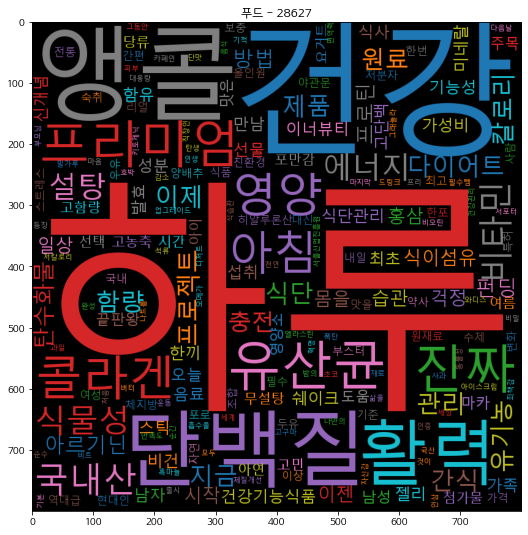

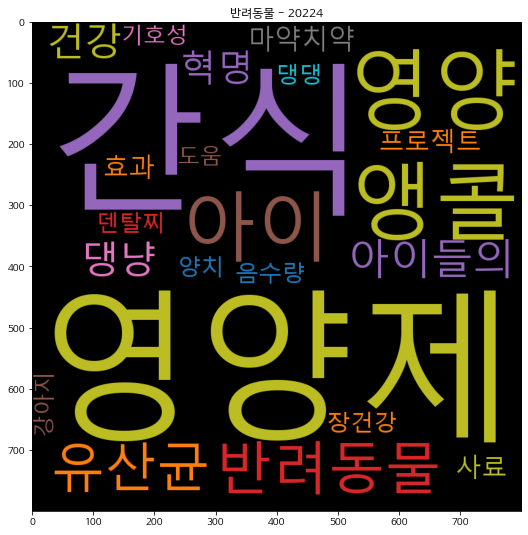

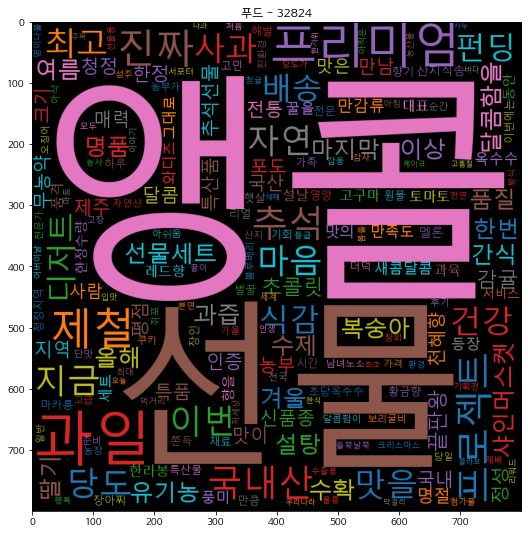

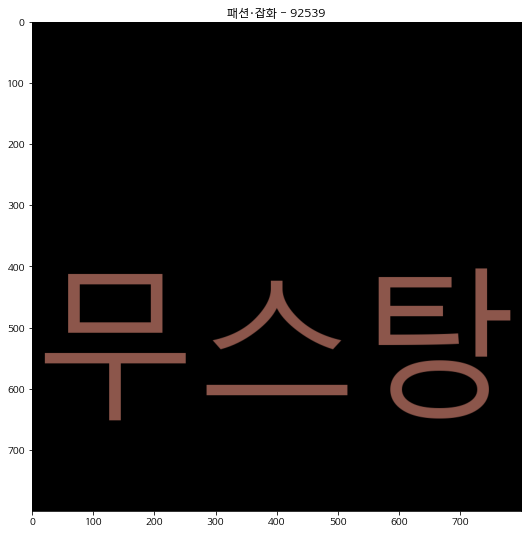

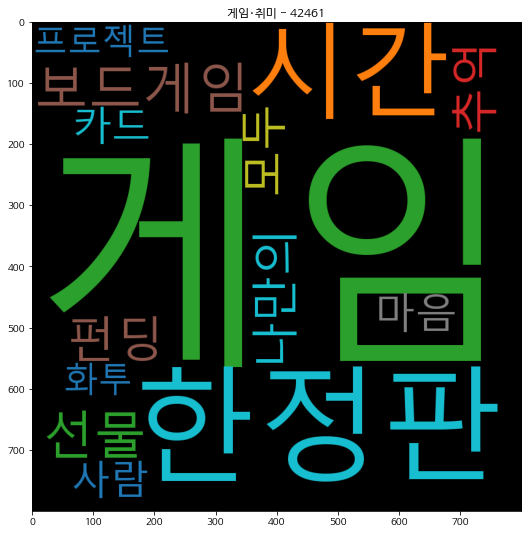

...

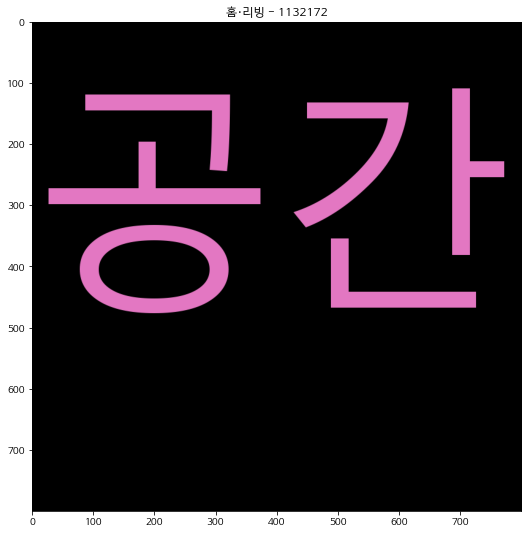

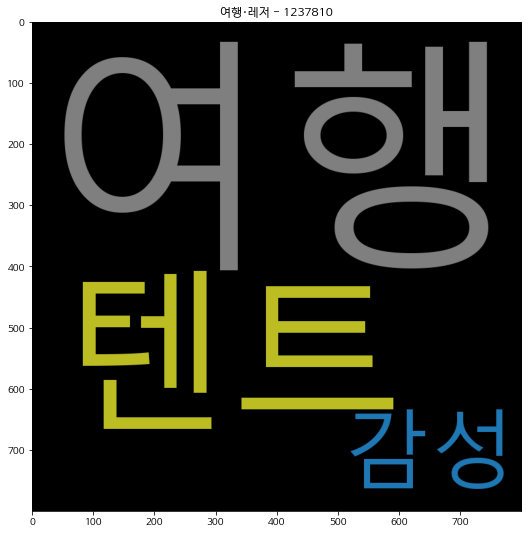

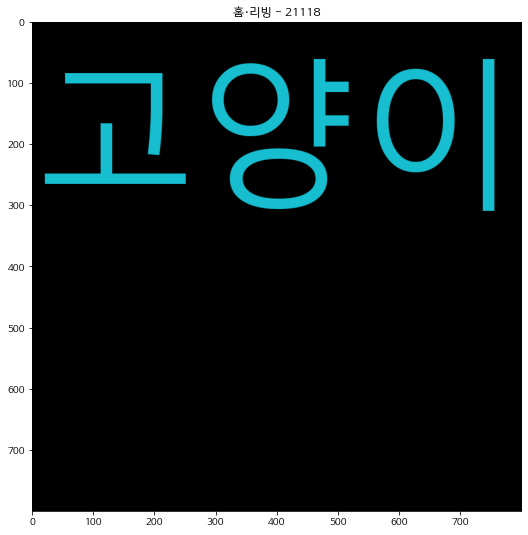

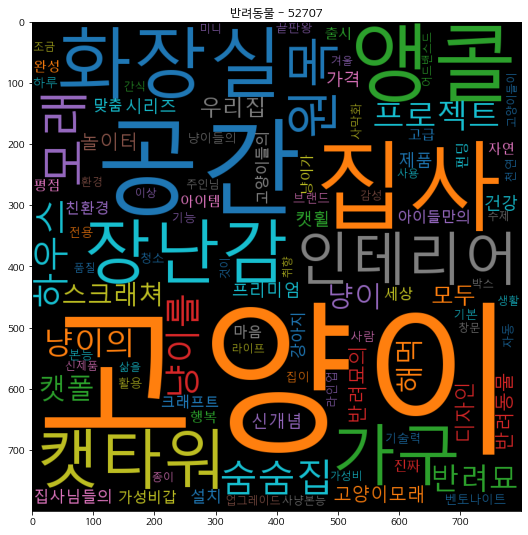

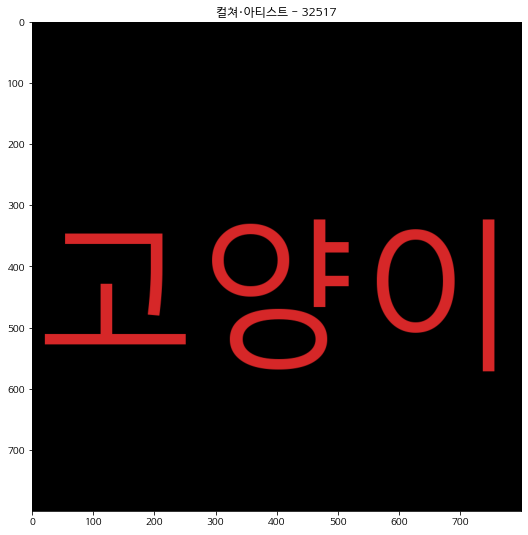

In [47]:
loop = tqdm(df_cl["cluster"].unique())
# category = "홈·리빙"
# category = "패션·잡화"
# df_catNum = pd.DataFrame(columns=clusters, index=range(71))

for idx, cluster in enumerate(loop):
    path = 'C:\\CDri_Programming\\Project\\result\\by_cluster_{}\\{}'.format(folder_number, cluster)
    os.makedirs(path, exist_ok=True)
    for category in df_cl["category"].unique():
        # 클러스터가 생성은 됐는데 개수가 너무 적으면 Word clouding이 의미가 없으니까
        if df_cl["cluster"].value_counts()[cluster] < 10:
            continue
        
        price =  df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), ["min_price"]].mean()
        keywords =  df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), ["keywords"]]
        words = []
        for keyword in keywords.values:
            for word in keyword[0].split(" "):
                words.append(word)
        
        c = Counter(words)
        c_after = dict()
        for word, count in c.items():
            if count > 5 :
                c_after[word] = count
        
        # wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, color_func=color_func)
        wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, colormap="tab10", background_color="black")
        if len(c_after) == 0 :
            continue
        gen = wc.generate_from_frequencies(c_after)
        plt.figure(figsize=(16,9))
        plt.title("{} - {:.0f}".format(category,price.item()))
        plt.imshow(gen)
        plt.savefig(path + "\\{} - {}.png".format(category,cluster))
        # plt.savefig(path + "\\{}.png".format(cluster))
        # plt.imsave(path + "\\{}.png".format(cluster), gen)
    

by_category

100%|██████████| 25/25 [00:05<00:00,  4.33it/s]
C:\Users\qkfxh\AppData\Local\Temp\ipykernel_25940\2213872497.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(16,9))


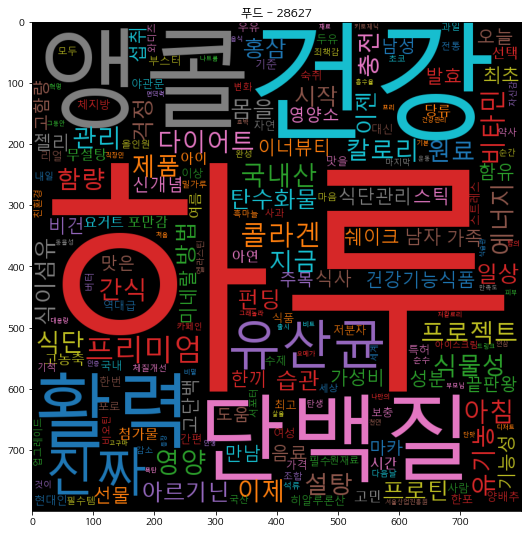

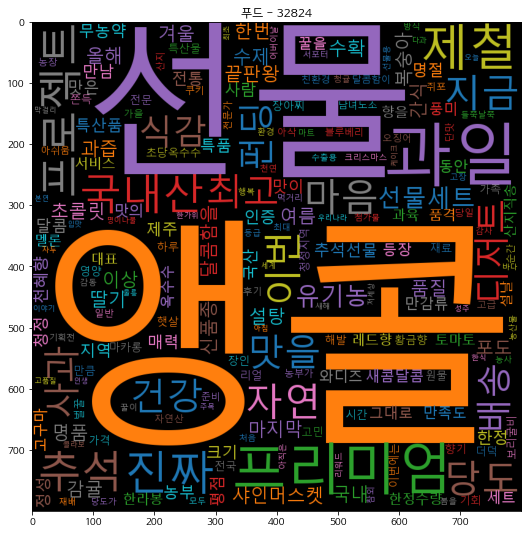

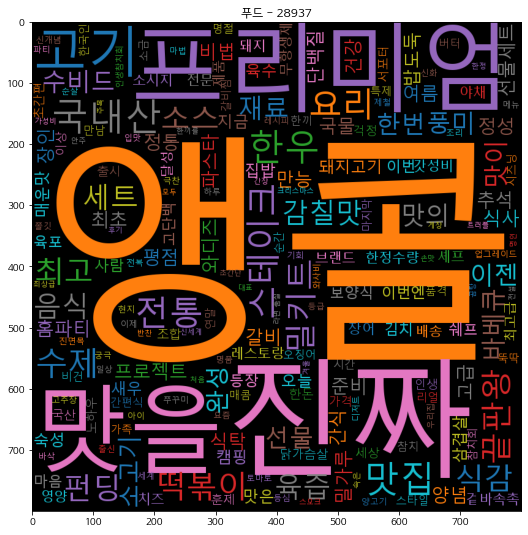

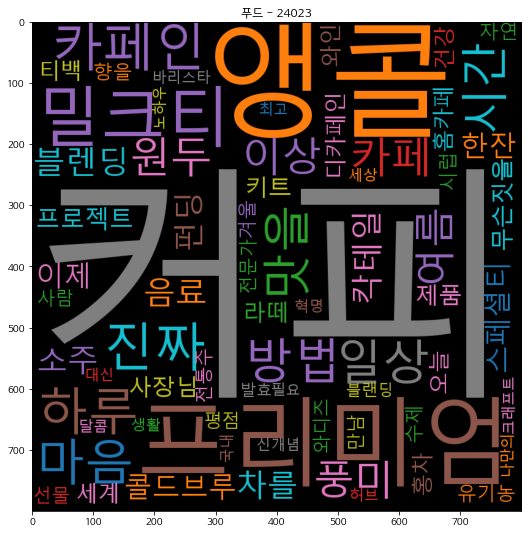

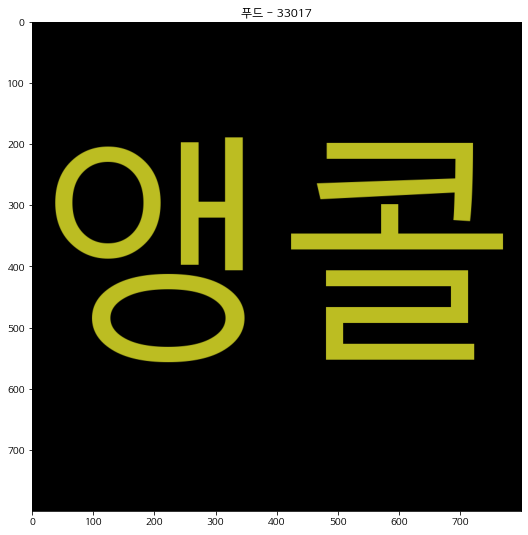

...

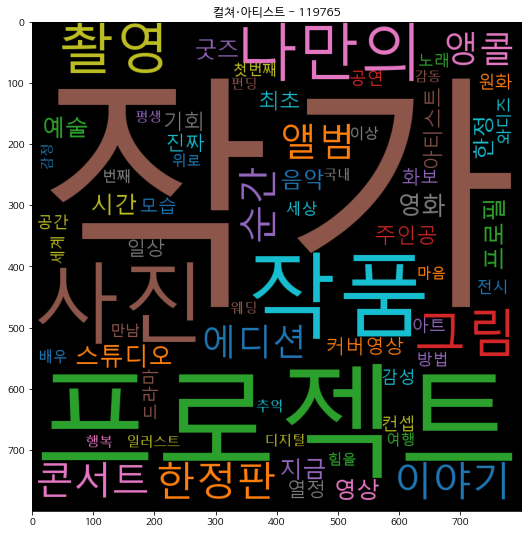

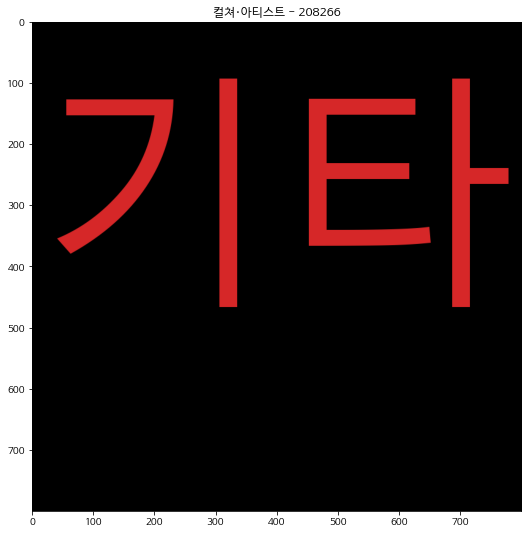

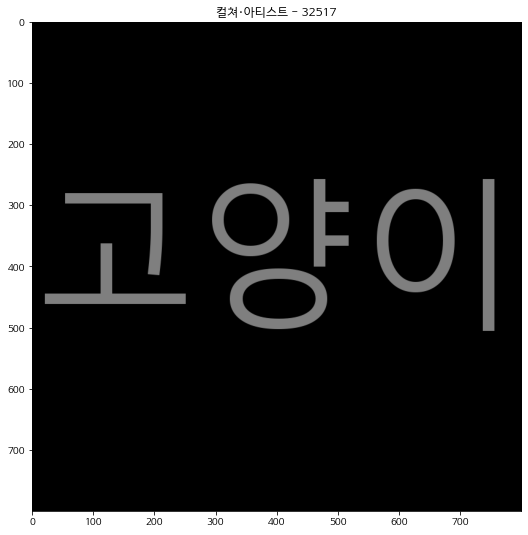

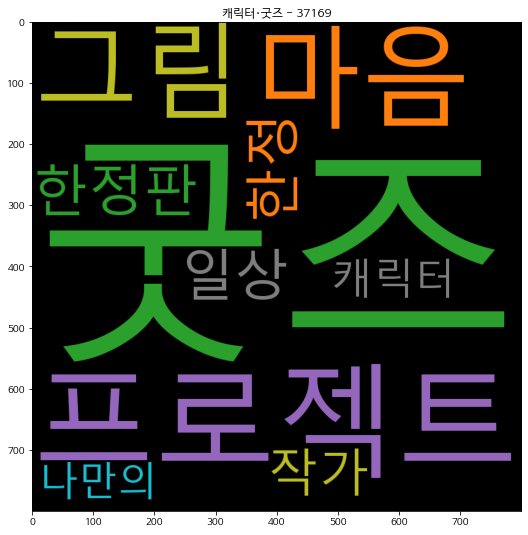

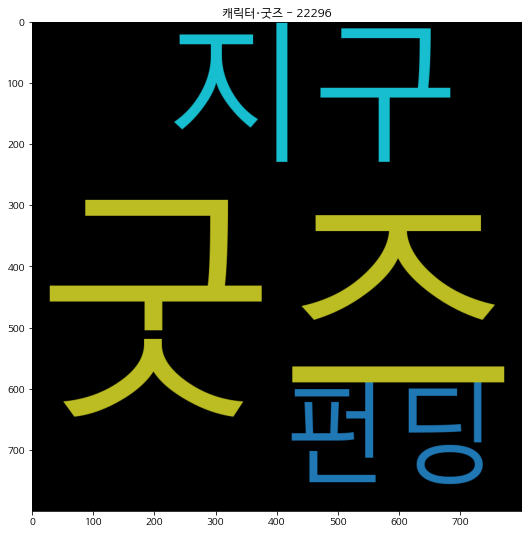

In [48]:
loop = tqdm(df_cl["cluster"].unique())
# category = "홈·리빙"
# category = "패션·잡화"
# df_catNum = pd.DataFrame(columns=clusters, index=range(71))

for category in df_cl["category"].unique():
    path = 'C:\\CDri_Programming\\Project\\result\\by_category_{}\\{}'.format(folder_number, category)
    os.makedirs(path, exist_ok=True)
    for idx, cluster in enumerate(loop):
        # 클러스터가 생성은 됐는데 개수가 너무 적으면 Word clouding이 의미가 없으니까
        if df_cl["cluster"].value_counts()[cluster] < 10:
            continue
        
        price =  df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), ["min_price"]].mean()
        keywords =  df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), ["keywords"]]
        words = []
        for keyword in keywords.values:
            for word in keyword[0].split(" "):
                words.append(word)
        
        c = Counter(words)
        c_after = dict()
        for word, count in c.items():
            if count > 5 :
                c_after[word] = count
        
        # wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, color_func=color_func)
        wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, colormap="tab10", background_color="black")
        if len(c_after) == 0 :
            continue
        gen = wc.generate_from_frequencies(c_after)
        plt.figure(figsize=(16,9))
        plt.title("{} - {:.0f}".format(category,price.item()))
        plt.imshow(gen)
        plt.savefig(path + "\\{} - {}.png".format(category,cluster))
        # plt.savefig(path + "\\{}.png".format(cluster))
        # plt.imsave(path + "\\{}.png".format(cluster), gen)
    

In [14]:
import numpy as np

arr = np.arange(0,12, dtype=np.int16).reshape(3,4)
arr[1,1:-1]

array([5, 6], dtype=int16)

도대체 배게가 어떻게 다르길레 제품이 이렇게 많을까에 대한 탐구<br>
1,5,9,26,39,

In [ ]:
loop = range(50)
category = "홈·리빙"

count = 0
for idx, cluster in enumerate(loop):
    texts =  dum.loc[(dum["cluster"]==cluster)&(dum["category"]==category), ["texts"]]
    bagae_count = 0
    for text in texts.values:
        if "베개" in text[0]:
            bagae_count += 1
    if len(texts) == 0 :
        continue
    print("Cluster - {} \t Total : {} - 베개 : {}, {:.2f}%".format(cluster, len(texts), bagae_count, bagae_count/len(texts)*100))
            

Cluster - 0 	 Total : 126 - 베개 : 5, 3.97%
Cluster - 1 	 Total : 195 - 베개 : 14, 7.18%
Cluster - 2 	 Total : 335 - 베개 : 17, 5.07%
Cluster - 3 	 Total : 240 - 베개 : 10, 4.17%
Cluster - 4 	 Total : 48 - 베개 : 3, 6.25%
Cluster - 5 	 Total : 134 - 베개 : 12, 8.96%
Cluster - 6 	 Total : 257 - 베개 : 18, 7.00%
Cluster - 7 	 Total : 86 - 베개 : 3, 3.49%
Cluster - 8 	 Total : 140 - 베개 : 8, 5.71%
Cluster - 9 	 Total : 139 - 베개 : 9, 6.47%
Cluster - 10 	 Total : 296 - 베개 : 22, 7.43%
Cluster - 11 	 Total : 98 - 베개 : 2, 2.04%
Cluster - 12 	 Total : 143 - 베개 : 8, 5.59%
Cluster - 13 	 Total : 52 - 베개 : 3, 5.77%
Cluster - 14 	 Total : 49 - 베개 : 1, 2.04%
Cluster - 15 	 Total : 182 - 베개 : 10, 5.49%
Cluster - 16 	 Total : 68 - 베개 : 4, 5.88%
Cluster - 17 	 Total : 137 - 베개 : 6, 4.38%
Cluster - 18 	 Total : 262 - 베개 : 16, 6.11%
Cluster - 19 	 Total : 73 - 베개 : 5, 6.85%
Cluster - 20 	 Total : 64 - 베개 : 4, 6.25%
Cluster - 21 	 Total : 141 - 베개 : 8, 5.67%
Cluster - 22 	 Total : 130 - 베개 : 3, 2.31%
Cluster - 24 	 Total 

## 프로젝트간 거리

In [ ]:
import random

df = pre_process()
df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv")

(30070, 7)


In [ ]:
import torch
import pandas as pd
from torch.nn import CosineSimilarity

cos = CosineSimilarity(dim=1, eps=1e-3)

for _ in range(10):
    rand_idx = random.randint(0,len(df))

    target = df.iloc[rand_idx]
    print("target : ",df_ori.iloc[rand_idx][["title", "explain"]].values)

    all_sims = pd.DataFrame(columns=["code", "sims", "idx"])

    for idx in range(len(df)):
        project = df.iloc[idx].values
        code = df_ori.iloc[idx]["code"]
        sim = cos(torch.Tensor(target.values).reshape(1,-1).to("cuda"), torch.Tensor(project).reshape(1,-1).to("cuda"))
        all_sims.loc[len(all_sims)] = [code, sim.item(), idx]
        
    print("bottom10")
    for code in all_sims.sort_values(by="sims")["code"][:10].values:
        project = df_ori.loc[(df_ori["code"]==code), ["title", "explain"]]
        print(project.values)
        
    print("top10")
    for code in all_sims.sort_values(by="sims")["code"][-10:].values:
        project = df_ori.loc[(df_ori["code"]==code), ["title", "explain"]]
        print(project.values)

target :  [' 민초단주목 민트초코와 설기 떡의 조합  쫀득 오독 상쾌  조선민초설기 '
 '민초단과 반민초단 모두를 위한  세상에 없던 새로운 민초  부드러운 설기와 함께 새롭게 탄생한 바오담 민초설기']
bottom10
[['길고양이들에게 두 번째 삶을 선물해주세요'
  '유기묘와 길고양이를 후원하는 그립톡과 케이스  티셔츠입니다  펀딩금액의 10 는 한국고양이보호협회에 기부됩니다 ']]
[[' 앵콜 씨드톡스  보르피린 50 000ppm의 홈에스테틱  명품피부완성 '
  '씨앗의 영양을 가득 채운 이 한병이 선사하는 특별한 피부관리를 경험 해 보세요 ']]
[[' 카니발 풀체인지  한번 더 FULL CHANGE 해드릴게요 l 캠핑카'
  '비싸고  주차공간 잡아먹는 트레일러와 카라반  이제  데일리 카니발에  캠핑 을 담아드릴게요']]
[['이제 간편하게 테니스치자 올인원 테니스백' '이제 편하게 테니스치러 다니자 올인원 테니스백']]
[['세상에서 가장 간편하고 저렴한 공기청정기' '세상에서 가장 저렴하고 간편한 공기청정기']]
[[' 놀이 학습 영어  여러 명의 아이들이 동시에 터치가 가능한 터치테이블 '
  '32인치 FULL HD 화면으로 우리 아이들의 영어   학습   놀이 프로그램을 경험해보세요  16개의 터치포인트로 여러명이 동시에 사용도 가능해 협동심까지 UP  시켜드립니다 ']]
[['일회용 비닐없이 장보기  고마운 주머니 습관'
  '일상 속에서 일회용 비닐 사용을 줄여주는 작은 습관  자연에게도 사람에게도 고마운 주머니를 소개합니다  함께 시작하는 이 작은 실천으로 작지 않은 변화가 오기를 희망합니다 ']]
[['주차관제시스템 설치 끝    이제부터 외부차량 아웃 '
  '주차순찰시스템   공동주택 아파트 빌라   상가  주차장 등 주차관리가 필요한 장소에 기존 주차관제시스템 가격의 절반수준으로 제공하고자 하는것이 본 프로젝트 미션입니다 ']]
[['무엇을  어떻게 정리할지 모를 때  이지픽 코드랩' '무엇을  어떻게 정리해야 할

In [ ]:
df_ori.iloc[rand_idx][["title","explain"]].values

array(['한장의 기적  시트 한장에 착한성분 고농축35ml 앰플한병이 통째로  ',
       '마스크팩 한장에 성분 좋은 고농축 에센스가 35ml씩이나  판테놀 병풀잎추출물 해조류추출물 베타 시토스테롤이 함유된 고영양 마스크팩 서포터님들의 피부에 영양을 공급해드리겠습니다 '],
      dtype=object)

In [ ]:
df_ori.iloc[rand_idx]

Unnamed: 0                                                      25633
num_reward                                                          3
min_price                                                     20000.0
target                                                      1000000.0
cnt_main_images                                                     3
cnt_title_images                                                    1
start_date                                                 2020.03.10
end_date                                                   2020.04.30
category                                                         홈·리빙
code                                                            60859
result                                                           1210
success                                                             1
cnt_sell                                                         50.0
subcategory                                                     기타 재화
title               

# 클러스터링 시각화

In [ ]:
import pandas as pd
import matplotlib
import matplotlib.font_manager as fm
# fm.get_fontconfig_fonts()
# font_location = '/usr/share/fonts/truetype/nanum/NanumGothicOTF.ttf'
dir = "C:\\Windows\\Fonts"
# dir = "C:\\Users\\qkfxh\\AppData\\Local\\Microsoft\\Windows\\Fonts"
# font_location = dir + '\\NanumSquare_0.ttf' # For Windows
font_location = dir + '\\Hancom Gothic Bold.ttf' # For Windows
font_name = fm.FontProperties(fname=font_location).get_name()
matplotlib.rc('font', family=font_name)


df_vis = pd.DataFrame(columns=["테크·가전", "뷰티", "벡터 값", "제품"])
df_vis.loc[len(df_vis)] = [1, 0, 0.2, "키보드"]
df_vis.loc[len(df_vis)] = [1, 0, 1.0, "충전기"]
df_vis.loc[len(df_vis)] = [1, 0, 5.0, "향기 무드등"]
df_vis.loc[len(df_vis)] = [0, 1, 0.1, "코트"]
df_vis.loc[len(df_vis)] = [0, 1, 1.2, "청바지"]
df_vis.loc[len(df_vis)] = [0, 1, 6.0, "향수"]

In [ ]:
df_vis

,테크·가전,뷰티,벡터 값,제품
0,1,0,0.2,키보드
1,1,0,1.0,충전기
2,1,0,5.0,향기 무드등
3,0,1,0.1,코트
4,0,1,1.2,청바지
5,0,1,6.0,향수


Text(0.5, 0.5, '뷰티')

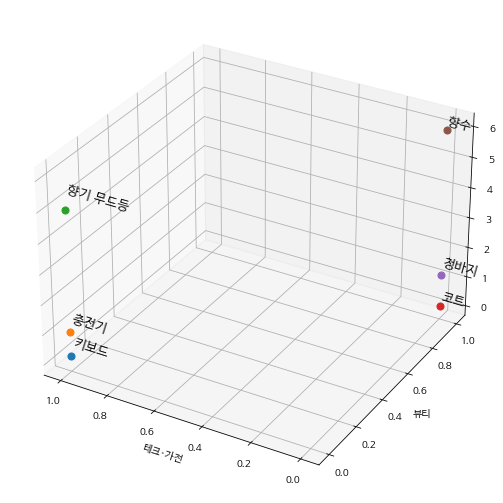

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import matplotlib.pyplot as plt

fig = plt.figure(figsize=[16,9])
# ax = Axes3D(fig)
ax = fig.add_subplot(projection='3d')


# sc = ax.scatter(df_vis.category1, df_vis.category2, df_vis.Value, s=100)
for idx in range(len(df_vis)):
    x,y,z,label = df_vis.iloc[idx]
    ax.scatter(x,y,z, s=50)
    ax.text(x,y,z,label,(1,0,0),fontsize=13)
    # print(x,y,z)
# sc = ax.text(df_vis.category1, df_vis.category2, df_vis.Value, s=100)

ax.invert_xaxis()
ax.set_xlabel("테크·가전")
ax.set_ylabel("뷰티")

# ax.plot_trisurf(df_vis.category1, df_vis.category2, df_vis.Value, cmap=cm.jet, linewidth=0.2)

# 데이터 베이스 외의 값

## pre_pre

In [1]:
import pandas as pd
import torch
import numpy as np
import stanza
from konlpy.tag import Okt, Kkma, Komoran
from transformers import BertTokenizerFast, BertModel, AutoModel, AutoTokenizer

tokenizer_word = BertTokenizerFast.from_pretrained("kykim/bert-kor-base")
model_word = BertModel.from_pretrained("kykim/bert-kor-base").to("cuda")

tokenizer_sent = AutoTokenizer.from_pretrained('jhgan/ko-sroberta-multitask')
model_sent = AutoModel.from_pretrained('jhgan/ko-sroberta-multitask').to("cuda")
stanza.download('ko') 
nlp = stanza.Pipeline('ko')

alph_sml = []
alph_lg = []
for i in range(65,91):
    alph_lg.append(chr(i))
for i in range(97,123):
    alph_sml.append(chr(i))
print(alph_sml)
print(alph_lg)

Jeosa = [
    '이',
    "가",
    "께서",
    "에서",
    "서",
    "의",
    "을",
    "를",
    "가",
    "에",
    "에게",
    "게",
    "께",
    "한테",
    "에게서",
    "보다",
    "로서",
    "로써",
    "라고",
    "고",
    "와",
    "와의",
    "과",
    "과의",
    "랑",
    "이랑",
    "같이",
    "처럼",
    "만큼",
    "은",
    "는",
    "이",
    "가",
    "도",
    "까지",
    "마저",
    "조차",
    "들",
    "들이",
    "들과",
    "대로"
]

this_is_not_word = [
    "1",
    "2",
    "3",
    "4",
    "5",
    "6",
    "7",
    "8",
    "9",
    "0",
    *alph_lg,
    *alph_sml,
    "와디즈",
    "것을",
    "이제",
    
]

okt = Okt()
kkma = Kkma()
komo = Komoran()

def compare_each_other(just : set(), konlp: set()):
    new_set = deep(just)
    # 단어에 조사 붙어있는게 있으면 제거
    for word in just:
        for itSelf in just:
            for jeosa in Jeosa:
                if itSelf+jeosa in word and word in new_set:
                    # print("removed {} - reason : jeosa".format(word))
                    new_set.remove(word)
    # 중복된 단어 제거 혹은 두 단어의 합성어를 통일
    # word 가 합성어 itSelf가 더 작은 단어
    for word in just:
        for itSelf in just:
            if itSelf in word and word in new_set and itSelf != word:
                # print("removed {} - reason : duplicate".format(word))
                new_set.remove(word)
                # new_set.add(word.replace(itSelf, ""))
        # 추가 예외 처리
    for word in just:
        for not_word in this_is_not_word:
            if not_word in word and word in new_set:  
                # print("removed {} - reason : not word".format(word))
                new_set.remove(word)
                break
    # 추가 형태소 분석기랑 비교, 조사 빼고 아예 명사만 남기기
    for word in konlp:
        for jeosa in Jeosa:
            if word+jeosa in new_set:
                # print("removed {} - reason : konlp".format(word+jeosa))
                new_set.remove(word+jeosa)
                new_set.add(word)
    return new_set

def compare_result(words_okt, words_kkma):
    result = words_okt.union(words_kkma)
    for word_okt in words_okt:
        for jeosa in Jeosa:
            if word_okt+jeosa in result:
                # print("removed {} - reason : result_okt".format(word_okt+jeosa))
                result.remove(word_okt+jeosa)
    for word_kkma in words_kkma:
        for jeosa in Jeosa:
            if word_kkma + jeosa in result:
                # print("removed {} - reason : result_kkma".format(word_kkma+jeosa))
                result.remove(word_kkma+jeosa)

    return result

    
# sent = df_summ["sent"][1]
def extract_noun(sent, is_print = False):
    doc = nlp(sent)
    words = set()
    words_okt = set()
    words_kkma = set()

    for sentence in doc.sentences:
        for word1 in sentence.words:
            # print(word.text, word.lemma, word.pos)
            if word1.pos == "NOUN":
                if len(word1.text) ==1:
                    continue
                words.add(word1.text)
                #방법3
                result = okt.nouns(word1.text)
                for word in result:
                    if len(word) ==1:
                        continue
                    words_okt.add(word)
                #방법4
                result = kkma.nouns(word1.text)
                for word in result:
                    if len(word) ==1:
                        continue
                    words_kkma.add(word)
    if is_print:
        print("before : {}".format(words))
    words_okt = compare_each_other(words, words_okt)
    if is_print:
        print("after okt : {}".format(words_okt))
    words_kkma = compare_each_other(words, words_kkma)
    if is_print:
        print("after kkma : {}".format(words_kkma))
    result = compare_result(words_okt, words_kkma)
    if is_print:
        print("\nafter result : {}".format(result))
    return result

def mean_pooling(model_output, attention_mask):
    token_embeddings = model_output[0] #First element of model_output contains all token embeddings
    input_mask_expanded = attention_mask.unsqueeze(-1).expand(token_embeddings.size()).float()
    return torch.sum(token_embeddings * input_mask_expanded, 1) / torch.clamp(input_mask_expanded.sum(1), min=1e-9)
# 결과끼리 단어+조사인 것을 먼저 교체하고 그리고 
# 100703

df_keyword = pd.read_csv(r"C:\CDri_Programming\Project\Data\keywords2.csv", encoding="cp949")
df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")

df_ori = df_ori.merge(df_keyword, on="code", how="left")
del df_ori["sent"]

c:\Anaconda\envs\Wadiz\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Some weights of the model checkpoint at kykim/bert-kor-base were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you exp

['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o', 'p', 'q', 'r', 's', 't', 'u', 'v', 'w', 'x', 'y', 'z']
['A', 'B', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'J', 'K', 'L', 'M', 'N', 'O', 'P', 'Q', 'R', 'S', 'T', 'U', 'V', 'W', 'X', 'Y', 'Z']


## pre_process()

In [7]:
import pandas as pd
from copy import deepcopy as deep
from sklearn.preprocessing import StandardScaler 

def pre_process(added=None):
    df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")
    if added:
        df_ori = df_ori.append(added, ignore_index=True)
        # print(df_ori.iloc[-1])
    # df_ori.dropna(axis=0, inplace=True)
    
    df_ = deep(df_ori)

    # 시기를 기간으로 바꿈
    df_["start_date"] = pd.to_datetime(df_["start_date"])
    df_["end_date"] = pd.to_datetime(df_["end_date"])
    df_["duration"] = (df_["end_date"] - df_["start_date"]).dt.days

    # 실수형 데이터 제외 다 삭제
    del df_["start_date"]
    del df_["end_date"]
    del df_["title"]
    del df_["explain"]
    del df_["main"]
    del df_["Unnamed: 0"]
    del df_["result"]
    del df_["success"]
    
    df_cat = df_["category"]
    del df_["category"]
    df_subCat = df_["subcategory"]
    del df_["subcategory"]
    df_code = df_["code"]
    del df_["code"]

    scaler = StandardScaler()
    df_.loc[:, :] = scaler.fit_transform(df_)
    print(df_.shape)

    # scaler = MinMaxScaler()
    #원핫인코딩
    df_ = pd.concat([df_ ,pd.get_dummies(df_cat, prefix="cat")], axis=1)
    df_ = pd.concat([df_ ,pd.get_dummies(df_subCat, prefix="subCat")], axis=1)
    # df = df_
    df_ = pd.concat([df_ ,df_code], axis=1)
    
    
    df_keyvec = pd.read_csv(r"C:\CDri_Programming\Project\Data\pooled_Vec.csv")
    
    # df_vec = pd.read_csv(r"C:\CDri_Programming\Project\Data\SROBERT.csv")
    df_vec = pd.read_csv(r"C:\CDri_Programming\Project\Data\SRoBert2.csv")
    
    if added:
        sent = added["title"] +" "+ added["explain"]
        words = extract_noun(sent)
        
        words_vec = []
        for word in words:
            inputs = tokenizer_word.batch_encode_plus([word])
            with torch.no_grad():
                out = model_word(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                            attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
            sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
            # words_out = torch.vstack(words_out).mean(0)
            words_vec.append(sentence_embeddings.to("cpu"))
        words_vec = np.concatenate(words_vec, axis=0)
        words_vec = np.mean(words_vec, axis=0)
        df_keyvec.loc[len(df_keyvec)] = [added["code"], *words_vec]
        print("df_keyVec : ", df_keyvec.shape)
        # added["keyvec"] = [added["code"], *words_vec]
        
        inputs = tokenizer_sent.batch_encode_plus([sent])
        with torch.no_grad():
            out = model_sent(input_ids = torch.tensor(inputs['input_ids']).to("cuda"),
                        attention_mask = torch.tensor(inputs['attention_mask']).to("cuda"))
        sentence_embeddings = mean_pooling(out, torch.tensor(inputs['attention_mask']).to("cuda"))
        # words_out = torch.vstack(words_out).mean(0)
        df_vec.loc[len(df_vec)] = [added["code"], *sentence_embeddings.to("cpu").numpy()[0]]
        print("df_sentVec : ", df_vec.shape)
        # added["sentvec"] = [added["code"], *sentence_embeddings.to("cpu").numpy()[0]]
    

    df_ = df_.merge(df_keyvec, how="left", on="code")
    df = df_.merge(df_vec, how="left", on="code")
    del df["code"]
    print(df.shape)
    return df

## Code

In [8]:
# code = 138885
# code = 146027
# code = 144928
# code = 138959
# code = 145103
# code = 148639
# code = 148083
# code = 149498
# code = 150042
# code = 144782
# code = 149558
code = 61234

In [22]:
df_ori = pd.read_csv(r"C:\CDri_Programming\Project\Data\Final_info.csv", encoding="utf-8")

df_check = deep(df_ori)

df_check["result"] = df_ori["result"]/10
df_check.loc[(df_check["result"]>=100), ["succcess"]] = 1
df_check.loc[(df_check["result"]<100), ["succcess"]] = 0
df_check.loc[:,["success", "result"]]

,success,result
0,1,43.5
1,1,44.2
2,1,27.8
3,0,0.0
4,1,12.6
...,...,...
30065,1,51.6
30066,0,0.7
30067,0,0.0
30068,1,652.5


In [19]:
df_ori.loc[df_ori["code"]==33437, :]

,Unnamed: 0,num_reward,min_price,target,cnt_main_images,cnt_title_images,start_date,end_date,category,code,result,success,cnt_sell,subcategory,title,explain,main
27729,30693,6,14800.0,5000000.0,27,1,2019.05.03,2019.06.02,테크·가전,33437,410,1,337.837838,기타 재화,이것은 USB인가 충전기인가 볼피너,그 동안 가지고 다니기 불편 하지 않으셨어요 세상에 단 하나뿐인 ALL IN ...,볼펜 스피너 USB 휴대폰 보조 밧데리 모두 가지고 다닐 때 많이 불편 하셨...


## Extract_information()

In [9]:
import time
from selenium import webdriver
from selenium import webdriver
from selenium.webdriver.common.by import By 
import time
import datetime
from selenium.webdriver.common.keys import Keys
from selenium.webdriver.chrome.options import Options
import pandas as pd
import requests
from bs4 import BeautifulSoup
from sklearn.feature_extraction.text import CountVectorizer
import re
from tqdm import tqdm
import tqdm

# from konlpy.tag import Okt
# import konlpy
# from konlpy.tag import Kkma, Komoran, Hannanum, Okt
# from konlpy.utils import pprint
# from konlpy.tag import Mecab


# Colab설정 + 빠르게, Colab에선 웹브라우저 창이 뜨지 않으므로 별도 설정한다.
options = webdriver.ChromeOptions()
options.add_argument('--headless')        # Head-less 설정
options.add_argument('--no-sandbox')
options.add_argument('--disable-dev-shm-usage')
prefs = {'profile.default_content_setting_values': { 'images': 2, 'popups': 2, 'geolocation': 2, 'notifications' : 2, 'auto_select_certificate': 2, 'fullscreen' : 2, 'mouselock' : 2, 'mixed_script': 2, 'media_stream' : 2, 'media_stream_mic' : 2, 'media_stream_camera': 2, 'protocol_handlers' : 2, 'ppapi_broker' : 2, 'automatic_downloads': 2, 'midi_sysex' : 2, 'push_messaging' : 2, 'ssl_cert_decisions': 2, 'metro_switch_to_desktop' : 2, 'protected_media_identifier': 2, 'app_banner': 2, 'site_engagement' : 2, 'durable_storage' : 2}}   
options.add_experimental_option('prefs', prefs)
driver = webdriver.Chrome(r'C:\CDri_Programming\Project\utils\chromedriver102.exe', options=options)

# 리워드 종류 (리워드 개수), 최저금액, 목표금액 / 금액, 메이커 정보, 이미지 개수, 펀딩기간, 카테고리명, 달성률, 과목코드, 리워드 상세정보
# 제목, 본문 설명란 가져오기 

# infos_1에는 제목, 본문, 설명란 등등
# infos_2에는 이미지개수같은 정보들

url = f"https://www.wadiz.kr/web/wcomingsoon/rwd/{code}"
resp = requests.get(url)
html = resp.text
soup = BeautifulSoup(html, 'html.parser')

        # 반환정책 url
url = f'https://www.wadiz.kr/web/campaign/detail/fundingInfo/{code}?_refer_section_st=REWARD_1' 
driver.get(url)
sub_category = driver.find_element(By.XPATH, '//*[@id="reward-static-product-content-app"]/div/div/p/span').text # 리워드 상세정보

# 스토리 url
url = f'https://www.wadiz.kr/web/campaign/detail/{code}?_refer_section_st=REWARD_1'
driver.get(url)
title = driver.find_element(By.XPATH, '//*[@id="container"]/div[3]/h2/a').text # 제목
title = re.sub('[^A-Za-z0-9가-힣]', ' ', title) # 특수문자 제거
explain = driver.find_element(By.XPATH, '//*[@id="container"]/div[6]/div/div[1]/div[2]/div/div/section/div[3]').text # 제목 밑 설명란 내용
explain = re.sub('[^A-Za-z0-9가-힣]', ' ', explain) # 특수문자 제거
main = driver.find_element(By.XPATH, '//*[@id="introdetails"]/div[2]').text # 본문 내용
main = re.sub('[^A-Za-z0-9가-힣]', ' ', main) # 특수문제 제거

driver.get(url)
# 달성률 
try:
  result = driver.find_element(By.XPATH, '//*[@id="container"]/div[6]/div/div[1]/div[1]/div[1]/div[1]/p[3]/strong').text  
except:
  pass

# 리워드 종류
num_reward = len(soup.find_all('div', attrs={'class':'top-info'}))

# 최저금액
prices = []
for i in range(len(soup.find_all('div', attrs={'class':'top-info'}))):
  string = soup.find_all('div', attrs={'class':'top-info'})[i].dt.text
  price = re.sub('[\D]', '', string)
  prices.append(int(price))
try:
  while 1:
    min_price = min(prices)
    if min_price <= 5000:
      prices.remove(min_price)
    else:
      break  
except:
  min_price = 0
  
# 목표금액
try:
  target = int(re.sub('[\D]', '', soup.select('div > div > p > span')[2].text))
except:
  target = int(re.sub('[\D]', '', soup.select('div > div > p > span')[0].text))

# 본문 이미지 개수
cnt_main_images = len(soup.find_all('img', attrs={'class':'fr-fic fr-dib'})) 

# 표지 이미지 개수
cnt_title_images = len(soup.find_all('img', attrs={'class':'img-responsive'})) 

# 펀딩기간 
start_date, end_date = soup.select('div > div > p > br > span')[0].text.split('-')[0], soup.select('div > div > p > br > span')[0].text.split('-')[1]

# 카테고리명
category = soup.find('p', attrs={'class':'title-info'}).text 

pending_dict ={
  "code" : code,
  "subcategory" : sub_category,
  "title" : title,
  "explain" : explain,
  "main" : main,
  "num_reward" : num_reward, 
  "min_price" : min_price,
  "target" : target,
  "cnt_main_images" : cnt_main_images,
  "cnt_title_images" : cnt_title_images,
  "start_date" : start_date,
  "end_date" : end_date,
  "category" : category,
  "result" : result,
  "cnt_sell" : target/min_price
}


C:\Users\qkfxh\AppData\Local\Temp\ipykernel_16560\716235342.py:31: DeprecationWarning: executable_path has been deprecated, please pass in a Service object
  driver = webdriver.Chrome(r'C:\CDri_Programming\Project\utils\chromedriver102.exe', options=options)


## KMeans

In [10]:
pending_dict["title"]

'달달한 복숭아와 향기로운 꽃차의 만남  궁금하지  차애수 복숭아꽃차 향수'

In [11]:
from sklearn.cluster import KMeans

df = pre_process(added=pending_dict)
kmeans = KMeans(n_clusters=25, random_state=0).fit(df)

pending_cluster = kmeans.labels_[-1]

df_cl = deep(df_ori)
df_cl["cluster"] = kmeans.labels_[:-1]

C:\Users\qkfxh\AppData\Local\Temp\ipykernel_16560\4129205492.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_ori = df_ori.append(added, ignore_index=True)


(30071, 7)
df_keyVec :  (30071, 769)
df_sentVec :  (30071, 769)
(30077, 1599)


ValueError: Length of values (30076) does not match length of index (30070)

In [ ]:
df_pending = df_cl.loc[(df_cl['cluster'] == pending_cluster)&(df_cl['category']==pending_dict["category"])&(df_cl["subcategory"]==pending_dict["subcategory"]), :]
df_pending.shape

(99, 19)

In [ ]:
pending_cluster

1

## Top10 & Bot 10

In [ ]:
from torch.nn import CosineSimilarity

cos = CosineSimilarity(dim=1, eps=1e-3)

target = df.iloc[-1]
print("target : ",pending_dict['title']+" "+pending_dict["explain"])

all_sims = pd.DataFrame(columns=["code", "sims", "idx"])

for idx in range(len(df_cl)):
    project = df.iloc[idx].values
    code = df_cl.iloc[idx]["code"]
    sim = cos(torch.Tensor(target.values).reshape(1,-1).to("cuda"), torch.Tensor(project).reshape(1,-1).to("cuda"))
    all_sims.loc[len(all_sims)] = [code, sim.item(), idx]
    
print("bottom10")
for idx, code in enumerate(all_sims.sort_values(by="sims")["code"][:10].values):
    project = df_cl.loc[(df_cl["code"]==code), ["title", "explain", "cluster"]]
    print(idx+1, " : " ,project.values[0][0], " - ", project.values[0][2], "code : {}".format(code))
    
print("top10")
for idx, code in enumerate(all_sims.sort_values(by="sims")["code"][-10:].values):
    project = df_cl.loc[(df_cl["code"]==code), ["title", "explain", "cluster"]]
    print(10-idx, " : ", project.values[0][0], " - ", project.values[0][2], "code : {}".format(code))
print("_______________________________________")

target :  3초설치 강력한 불멍 감성캠핑 아름다운 샐러맨더 화로대   테이블 3초설치 강력한 불멍 감성 캠핑 샐러맨더 화로대   테이블
bottom10
1  :  세상에 없던 수제간식  최초공개 연어왕 갈비  -  7 code : 120693.0
2  :  이제는 끝까지 읽어보자  이 책이 당신을 끝까지 읽게 해줍니다   -  21 code : 31648.0
3  :  세상에 없던 단백질 쉐이크 이제 ABC 선식으로 식단 관리하세요   -  9 code : 103353.0
4  :  미국 정규 수학 교과서를 통해 영어로 배우는 우리나라 초등수학 프리패스  -  21 code : 130331.0
5  :  사료 안 먹는 아이들을 위한 영양만점 강아지 화식 4종  -  9 code : 130892.0
6  :  길고양이들에게 두 번째 삶을 선물해주세요  -  17 code : 42099.0
7  :  교회는 오래 다녔지만 성경을 제대로 읽어 본 적이 없다면   -  21 code : 34615.0
8  :  댕댕이 건강 관리 편식 극복을 한번에  알래스카 연어로 만든 습식파우더   -  22 code : 121572.0
9  :  어떤 영양제도 농협 종합영양제를 이길 순 없다    농협펫사랑 안심이G   -  9 code : 134964.0
10  :   특허 탈모기능성 아직도 샴푸로 탈모관리 하시나요  아워그린 헤어토닉  -  14 code : 66040.0
top10
10  :  1초점화 100분연소   특별한 캠핑을위한 아빠장작 락큰롱 퐈이야  -  1 code : 71342.0
9  :   감성캠핑  캠핑매니아가 직접 만든 하이엔드급 화로대  -  1 code : 112836.0
8  :  예쁜 감성캠핑 윈트리 windtree  유닛테이블 스툴  -  1 code : 130114.0
7  :  3차 연소로 완벽에 가까운 화덕 난로 오븐  마이화덕 5 0만점  -  2 code : 133444.0
6  :   캠핑의 재해석  황동  크롬 LED 랜턴과

## word cloud

C:\Users\qkfxh\AppData\Local\Temp\ipykernel_9396\942490361.py:33: UserWarning: Glyph 50668 (\N{HANGUL SYLLABLE YEO}) missing from current font.
  plt.savefig("single image{} - {}.png".format(category,cluster))
C:\Users\qkfxh\AppData\Local\Temp\ipykernel_9396\942490361.py:33: UserWarning: Glyph 54665 (\N{HANGUL SYLLABLE HAENG}) missing from current font.
  plt.savefig("single image{} - {}.png".format(category,cluster))
C:\Users\qkfxh\AppData\Local\Temp\ipykernel_9396\942490361.py:33: UserWarning: Glyph 47112 (\N{HANGUL SYLLABLE RE}) missing from current font.
  plt.savefig("single image{} - {}.png".format(category,cluster))
C:\Users\qkfxh\AppData\Local\Temp\ipykernel_9396\942490361.py:33: UserWarning: Glyph 51200 (\N{HANGUL SYLLABLE JEO}) missing from current font.
  plt.savefig("single image{} - {}.png".format(category,cluster))
c:\Anaconda\envs\Wadiz\lib\site-packages\IPython\core\pylabtools.py:151: UserWarning: Glyph 50668 (\N{HANGUL SYLLABLE YEO}) missing from current font.
  fig.ca

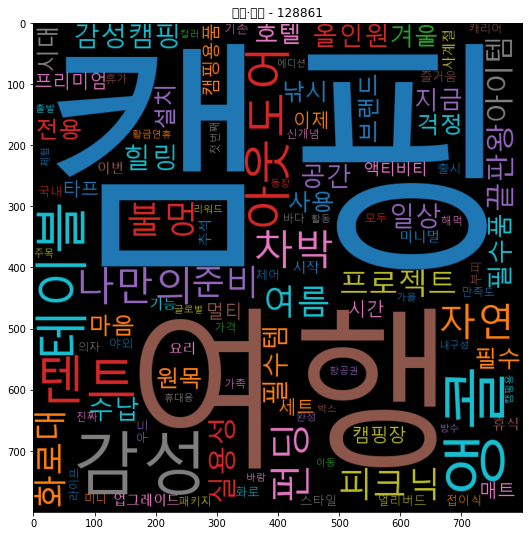

In [14]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
from konlpy.tag import Okt
from PIL import Image
import numpy as np
import pandas as pd

cluster = 1
category = "여행·레저"

price =  df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), ["min_price"]].mean()
keywords =  df_cl.loc[(df_cl["cluster"]==cluster)&(df_cl["category"]==category), ["keywords"]]
words = []
for keyword in keywords.values:
    for word in keyword[0].split(" "):
        words.append(word)

c = Counter(words)
c_after = dict()
for word, count in c.items():
    if count > 5 :
        c_after[word] = count

# wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, color_func=color_func)
wc = WordCloud(font_path='malgun', width=400, height=400, scale=2.0, max_font_size=250, colormap="tab10", background_color="black")
if len(c_after) == 0 : pass
else:
    gen = wc.generate_from_frequencies(c_after)
    plt.figure(figsize=(16,9))
    plt.title("{} - {:.0f}".format(category,price.item()))
    plt.imshow(gen)
    plt.savefig("single image{} - {}.png".format(category,cluster))